# Project ARI3129 - Object Detection & Localisation using Yolov5
---

**Name:** Sean David Muscat

**ID No:** 0172004L

---

## Automated Dataset Management with Roboflow and Folder Organization

This script automates the process of managing a dataset using Roboflow. It creates necessary directories, checks for installed dependencies, installs them if missing, and downloads the dataset. It also organizes the dataset into a structured folder hierarchy, ensuring everything is ready for further use.

In [2]:
import os
import subprocess
import shutil
import importlib


# Constants for colored output
COLORS = {
    "green": "\033[92m",  # Green text
    "red": "\033[91m",    # Red text
    "reset": "\033[0m"    # Reset to default color
}

# Define the path to the Versions folder and the target subfolder
versions_path = os.path.abspath(os.path.join("..", "Versions"))
target_subfolder = os.path.join(versions_path, "MDD-SDM-Yolov5")

# Check if the Versions folder exists, if not, create it
if not os.path.exists(versions_path):
    os.makedirs(versions_path)
    print(f"[{COLORS['green']}✔{COLORS['reset']}] Folder created at: {versions_path}")

# Check if the MDD-SDM-Yolov5 subfolder exists
if os.path.exists(target_subfolder):
    print(f"[{COLORS['green']}✔{COLORS['reset']}] The subfolder '{target_subfolder}' already exists. Skipping download!")
else:
    # Check if roboflow is installed
    if importlib.util.find_spec("roboflow") is not None:                                                                                                        # type: ignore
        print(f"[{COLORS['green']}✔{COLORS['reset']}] Roboflow is already installed!")
    else:
        # Install roboflow using pip
        try:
            subprocess.check_call(["pip", "install", "roboflow"])
            print(f"[{COLORS['green']}✔{COLORS['reset']}] Roboflow successfully installed!")
        except subprocess.CalledProcessError as e:
            print(f"[{COLORS['red']}✖{COLORS['reset']}]Failed to install Roboflow. Please check your setup.")
            raise e

    # Import and use Roboflow
    from roboflow import Roboflow                                                                                                                               # type: ignore

    # Prompt the user for their API key
    print("Please enter your Roboflow API key to download the dataset...")
    api_key = input("Please enter your Roboflow API key: ")

    # Initialize Roboflow with the provided API key
    rf = Roboflow(api_key=api_key)

    # Retrieve project and version
    project = rf.workspace("advanced-cv").project("maltese-domestic-dataset")
    version = project.version(1)

    # Download the dataset
    dataset = version.download("yolov5")

    current_folder = os.getcwd()  # Get the current working directory
    original_folder = os.path.join(current_folder, "Maltese-Domestic-Dataset--1")
    renamed_folder = os.path.join(current_folder, "MDD-SDM-Yolov5")
    target_folder = os.path.join(versions_path, "MDD-SDM-Yolov5")

    # Check if the original folder exists
    if os.path.exists(original_folder):
        # Rename the folder
        os.rename(original_folder, renamed_folder)

        # Move the renamed folder to ../Versions/
        shutil.move(renamed_folder, target_folder)
        print(f"[{COLORS['green']}✔{COLORS['reset']}] Folder downloaded to: {target_folder}")
    else:
        print(f"[{COLORS['red']}✖{COLORS['reset']}]Folder '{original_folder}' does not exist. No action taken.")


[✔] The subfolder 'e:\SEAN\Adv_CV\Versions\MDD-SDM-Yolov5' already exists. Skipping download!


## Automated Library Installer in Python

This script automates checking and installing libraries from a JSON file. It verifies installations, installs missing libraries via `pip`, and provides clear, colored output for success or errors. With built-in error handling and preloaded common libraries, it simplifies dependency management in Python projects.

In [3]:
import json
import importlib.util

# Path to the JSON file
lib_file_path = os.path.join("..", "Libraries", "Task2_SDM_Lib.json")

# Read the libraries from the JSON file
try:
    with open(lib_file_path, 'r') as file:
        libraries = json.load(file)
except FileNotFoundError:
    print(f"{COLORS['red']}Error: Library file not found at {lib_file_path}{COLORS['reset']}")
    exit(1)
except json.JSONDecodeError:
    print(f"{COLORS['red']}Error: Failed to decode JSON from the library file.{COLORS['reset']}")
    exit(1)

# Function to check and install libraries
def check_and_install_libraries(libraries):
    for lib, import_name in libraries.items():
        # Check if the library is installed by checking its module spec
        if importlib.util.find_spec(import_name) is not None:
            print(f"[{COLORS['green']}✔{COLORS['reset']}] Library '{lib}' is already installed.")
        else:
            # If the library is not found, try to install it
            print(f"[{COLORS['red']}✖{COLORS['reset']}] Library '{lib}' is not installed. Installing...")
            try:
                subprocess.check_call(["pip", "install", lib])
                print(f"[{COLORS['green']}✔{COLORS['reset']}] Successfully installed '{lib}'.")
            except subprocess.CalledProcessError:
                print(f"[{COLORS['red']}✖{COLORS['reset']}] Failed to install '{lib}'. Please install it manually.")


# Execute the function to check and install libraries
check_and_install_libraries(libraries)

# Import necessary libraries 
import cv2  # OpenCV for image processing
import time
import random
import matplotlib.pyplot as plt  # For plotting and visualisation
import seaborn as sns  # For advanced visualisation
import numpy as np  # For numerical operations
import matplotlib.patches as patches  # For drawing patches on plots
import concurrent.futures
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm  # For progress bars
import torch  # PyTorch for Yolov5
import pandas as pd  # For handling tabular data
import yaml  # For working with data.yaml files
import scipy  # For advanced scientific calculations
from pathlib import Path  # For handling file paths
from ultralytics import YOLO
from IPython.display import Image, display


[✔] Library 'opencv-python' is already installed.
[✔] Library 'matplotlib' is already installed.
[✔] Library 'tqdm' is already installed.
[✔] Library 'ultralytics' is already installed.
[✔] Library 'torch' is already installed.
[✔] Library 'pandas' is already installed.
[✔] Library 'seaborn' is already installed.
[✔] Library 'pyyaml' is already installed.
[✔] Library 'scipy' is already installed.
[✔] Library 'tensorboard' is already installed.


In [3]:
# Path to the yolov5n.yaml file
model_config_path = os.path.join(os.path.abspath(os.path.join(os.getcwd(), os.pardir)), "Versions", "yolov5", "models", "yolov5n.yaml")

# Load the YOLO model
model = YOLO(model_config_path)

print(f"[✔] YOLOv5 model initialized with configuration: {model_config_path}")

[✔] YOLOv5 model initialized with configuration: e:\SEAN\Adv_CV\Versions\yolov5\models\yolov5n.yaml


In [6]:
# Path to the data.yaml file
data_yaml_path = os.path.join(os.path.abspath(os.path.join(os.getcwd(), os.pardir)), "Versions", "MDD-SDM-Yolov5", "data.yaml")

# Train the YOLO model with results saved in runs/detect
results = model.train(
    data=data_yaml_path,      # Path to the dataset configuration
    epochs=100,                # Number of epochs
    imgsz=640,                # Image size
    batch=16,                 # Batch size
    workers=4,                # Number of data loader workers
    device='cpu',             # Use CPU (or GPU with '0', '1', etc.)
    project='runs/detect',    # Save results in the detect directory
    name='MDD-SDM-Yolov5-v3',  # Subdirectory for this specific run (change run to v2, v3, etc)
    patience = 10,
    pretrained = False
)
# Experiment with patience, learning rate and epochs (epochs is very good at 65, so check) or else patience = 10, with epochs at 100
# Runs v1 & v4 epochs 50. v5 epochs 60. v2 epochs 65. v3 epochs 100 patience 10 


print(f"[✔] Training completed! Results saved in: {results.save_dir}")

metrics = model.val()
print("Validation Metrics:", metrics)

New https://pypi.org/project/ultralytics/8.3.65 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.64  Python-3.11.9 torch-2.5.1+cpu CPU (Intel Core(TM) i5-8400 2.80GHz)
engine\trainer: task=detect, mode=train, model=e:\SEAN\Adv_CV\Versions\yolov5\models\yolov5n.yaml, data=e:\SEAN\Adv_CV\Versions\MDD-SDM-Yolov5\data.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=4, project=runs/detect, name=MDD-SDM-Yolov5-v3, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnos

train: Scanning E:\SEAN\Adv_CV\Versions\MDD-SDM-Yolov5\Maltese-Domestic-Dataset--1\train\labels.cache... 748 images, 0 backgrounds, 0 corrupt: 100%|██████████| 748/748 [00:00<?, ?it/s]
val: Scanning E:\SEAN\Adv_CV\Versions\MDD-SDM-Yolov5\Maltese-Domestic-Dataset--1\valid\labels.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]

Plotting labels to runs\detect\MDD-SDM-Yolov5-v3\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\MDD-SDM-Yolov5-v3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      1.619      1.773      1.821         65        640: 100%|██████████| 47/47 [03:11<00:00,  4.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]

                   all         70        228      0.568      0.438      0.433      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      1.643      1.865      1.836         93        640: 100%|██████████| 47/47 [02:59<00:00,  3.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.19s/it]

                   all         70        228      0.548      0.392      0.439       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      1.638       1.86      1.857         52        640: 100%|██████████| 47/47 [02:58<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]

                   all         70        228      0.512      0.456      0.458      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      1.659      1.857      1.847         94        640: 100%|██████████| 47/47 [02:56<00:00,  3.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]

                   all         70        228      0.462      0.384      0.383      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G      1.676      1.883      1.878         60        640: 100%|██████████| 47/47 [02:56<00:00,  3.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]

                   all         70        228      0.433       0.43       0.39      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      1.648      1.874      1.855         57        640: 100%|██████████| 47/47 [02:56<00:00,  3.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.05s/it]

                   all         70        228      0.562      0.394      0.433      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      1.641       1.84      1.839         68        640: 100%|██████████| 47/47 [02:58<00:00,  3.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]

                   all         70        228      0.446      0.416       0.42      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G      1.655      1.786      1.838         62        640: 100%|██████████| 47/47 [02:57<00:00,  3.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.06s/it]

                   all         70        228      0.497      0.428      0.434       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      1.641      1.807      1.827         67        640: 100%|██████████| 47/47 [02:56<00:00,  3.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         70        228      0.534       0.39      0.415      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.637      1.795      1.825        120        640: 100%|██████████| 47/47 [02:57<00:00,  3.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]

                   all         70        228      0.524      0.347      0.331      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G      1.668      1.785      1.843         73        640: 100%|██████████| 47/47 [02:57<00:00,  3.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.17s/it]

                   all         70        228      0.518      0.387      0.422      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      1.615      1.794      1.833         45        640: 100%|██████████| 47/47 [02:57<00:00,  3.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]

                   all         70        228      0.446      0.457      0.468      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G      1.622      1.726      1.814         69        640: 100%|██████████| 47/47 [02:57<00:00,  3.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         70        228      0.512      0.438      0.468      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G      1.621      1.734      1.816         91        640: 100%|██████████| 47/47 [02:57<00:00,  3.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         70        228      0.585       0.43       0.49      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      1.619      1.699       1.79         60        640: 100%|██████████| 47/47 [02:57<00:00,  3.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.25s/it]

                   all         70        228      0.579      0.423      0.457       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G      1.604      1.694      1.784         81        640: 100%|██████████| 47/47 [02:58<00:00,  3.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]

                   all         70        228      0.615      0.422      0.475       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G      1.585      1.684      1.791         72        640: 100%|██████████| 47/47 [02:57<00:00,  3.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.13s/it]

                   all         70        228      0.608      0.461        0.5      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G        1.6      1.628      1.784         65        640: 100%|██████████| 47/47 [02:57<00:00,  3.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]

                   all         70        228      0.575      0.477      0.487      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      1.577      1.657      1.766         78        640: 100%|██████████| 47/47 [02:57<00:00,  3.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         70        228      0.546      0.442      0.488      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      1.559      1.621      1.746         84        640: 100%|██████████| 47/47 [02:56<00:00,  3.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         70        228       0.57      0.427      0.463      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G       1.54      1.626      1.737         40        640: 100%|██████████| 47/47 [02:56<00:00,  3.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         70        228      0.394      0.481      0.419      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      1.558      1.622      1.739        122        640: 100%|██████████| 47/47 [02:58<00:00,  3.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]

                   all         70        228      0.574      0.457      0.475      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G      1.536      1.636      1.743         62        640: 100%|██████████| 47/47 [02:56<00:00,  3.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.13s/it]

                   all         70        228       0.67       0.44      0.522      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G      1.554      1.585      1.727         67        640: 100%|██████████| 47/47 [02:57<00:00,  3.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         70        228      0.569      0.497      0.517      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G       1.56      1.588      1.749        108        640: 100%|██████████| 47/47 [02:56<00:00,  3.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]

                   all         70        228      0.574      0.444      0.513      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G      1.525      1.528      1.712         46        640: 100%|██████████| 47/47 [02:57<00:00,  3.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.06s/it]

                   all         70        228      0.591      0.488      0.526      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G      1.531      1.549       1.73         77        640: 100%|██████████| 47/47 [02:59<00:00,  3.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]

                   all         70        228      0.622       0.42      0.482      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G      1.525      1.537      1.718         96        640: 100%|██████████| 47/47 [02:58<00:00,  3.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]

                   all         70        228      0.541      0.458      0.486      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G      1.508      1.513        1.7        113        640: 100%|██████████| 47/47 [02:59<00:00,  3.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         70        228      0.531      0.511       0.48      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G      1.506      1.479      1.693         93        640: 100%|██████████| 47/47 [02:58<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         70        228      0.655      0.501       0.52      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G      1.514      1.524      1.704         85        640: 100%|██████████| 47/47 [03:01<00:00,  3.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.15s/it]

                   all         70        228      0.619      0.423      0.487      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G      1.528      1.521      1.728         84        640: 100%|██████████| 47/47 [02:58<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         70        228      0.616      0.468      0.522      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G      1.515      1.522      1.701         61        640: 100%|██████████| 47/47 [02:57<00:00,  3.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         70        228      0.499      0.548      0.495      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G      1.491      1.472      1.676         69        640: 100%|██████████| 47/47 [03:00<00:00,  3.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.18s/it]

                   all         70        228      0.531        0.5      0.503      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G       1.49       1.45      1.674         59        640: 100%|██████████| 47/47 [02:59<00:00,  3.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]

                   all         70        228       0.57      0.525      0.539      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G       1.51      1.478      1.694        105        640: 100%|██████████| 47/47 [03:00<00:00,  3.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.13s/it]

                   all         70        228      0.527      0.466      0.485      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G      1.491      1.445      1.675         98        640: 100%|██████████| 47/47 [02:58<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]

                   all         70        228      0.637      0.509      0.505      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G      1.472      1.436      1.665         46        640: 100%|██████████| 47/47 [02:58<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]

                   all         70        228       0.54       0.49      0.511      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G      1.458      1.417      1.663         49        640: 100%|██████████| 47/47 [02:57<00:00,  3.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]

                   all         70        228      0.637      0.488      0.537      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G      1.447      1.447      1.645         39        640: 100%|██████████| 47/47 [02:56<00:00,  3.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.06s/it]

                   all         70        228      0.579      0.501      0.546      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G      1.479      1.444      1.668         94        640: 100%|██████████| 47/47 [02:59<00:00,  3.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]

                   all         70        228       0.57      0.526      0.519      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G      1.451      1.414      1.654         70        640: 100%|██████████| 47/47 [02:59<00:00,  3.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]

                   all         70        228      0.464      0.557      0.517      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G      1.434      1.388       1.65         53        640: 100%|██████████| 47/47 [02:58<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]

                   all         70        228      0.527      0.527      0.521      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G      1.432       1.39      1.628         70        640: 100%|██████████| 47/47 [02:58<00:00,  3.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]

                   all         70        228      0.554      0.484      0.477      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G      1.447      1.396      1.644         32        640: 100%|██████████| 47/47 [02:57<00:00,  3.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]

                   all         70        228      0.525      0.512      0.503      0.306
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 35, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



45 epochs completed in 2.316 hours.
Optimizer stripped from runs\detect\MDD-SDM-Yolov5-v3\weights\last.pt, 5.3MB
Optimizer stripped from runs\detect\MDD-SDM-Yolov5-v3\weights\best.pt, 5.3MB

Validating runs\detect\MDD-SDM-Yolov5-v3\weights\best.pt...
Ultralytics 8.3.64  Python-3.11.9 torch-2.5.1+cpu CPU (Intel Core(TM) i5-8400 2.80GHz)
YOLOv5n summary (fused): 193 layers, 2,503,724 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:05<00:00,  1.72s/it]


                   all         70        228      0.567      0.525      0.539      0.316
           Mixed Waste         20         67      0.451      0.627      0.536      0.286
         Organic Waste         26         53      0.667      0.528      0.648      0.403
           Other Waste         23         56      0.484      0.214      0.202      0.116
   Recyclable Material         25         52      0.668      0.731      0.769      0.462
Speed: 1.7ms preprocess, 62.7ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs\detect\MDD-SDM-Yolov5-v3
[✔] Training completed! Results saved in: runs\detect\MDD-SDM-Yolov5-v3
Ultralytics 8.3.64  Python-3.11.9 torch-2.5.1+cpu CPU (Intel Core(TM) i5-8400 2.80GHz)
YOLOv5n summary (fused): 193 layers, 2,503,724 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning E:\SEAN\Adv_CV\Versions\MDD-SDM-Yolov5\Maltese-Domestic-Dataset--1\valid\labels.cache... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.05s/it]


                   all         70        228      0.567      0.525      0.539      0.316
           Mixed Waste         20         67      0.451      0.627      0.536      0.286
         Organic Waste         26         53      0.667      0.528      0.648      0.403
           Other Waste         23         56      0.484      0.214      0.202      0.116
   Recyclable Material         25         52      0.668      0.731      0.769      0.462
Speed: 2.3ms preprocess, 58.8ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to runs\detect\MDD-SDM-Yolov5-v32
Validation Metrics: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x00000198D0A001D0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    


This cell processes YOLOv5 output in the runs/detect directory by identifying folders with specific naming patterns, allowing user selection, and displaying relevant evaluation images and plots. It filters folders ending with "R" and containing "SDM" (my initials, so only sorting folders generated by YOLOv5 since that is my section), sorts them, and prompts the user to choose one. The cell retrieves evaluation images from the selected folder, excluding files named with "val_batch", and displays them alongside visualisations such as confusion matrices, F1-confidence curves, precision-recall curves, and other performance metrics. Additionally, it locates and displays a consolidated results.png file from the non-"R" version of the folder, providing comprehensive insights into the model's performance.

Available folders:
1. MDD-SDM-Yolov5-v2R
2. MDD-SDM-Yolov5-v3R
3. MDD-SDM-Yolov5-v4R
4. MDD-SDM-Yolov5-v5R
5. MDD-SDM-Yolov5_v1R

Selected folder: MDD-SDM-Yolov5-v3R


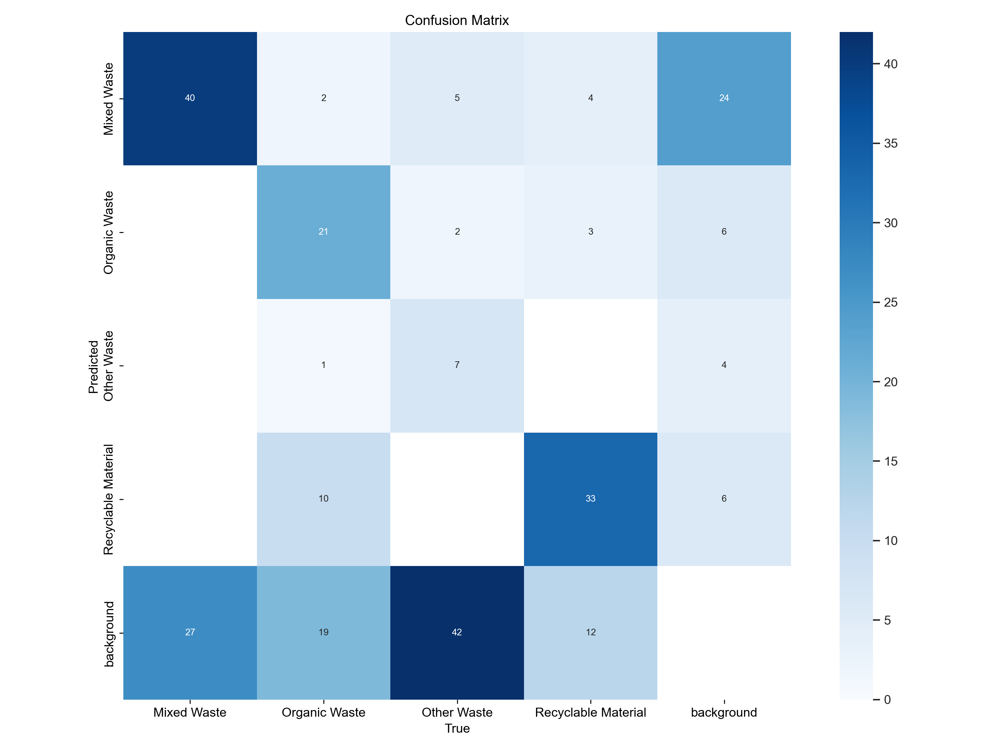

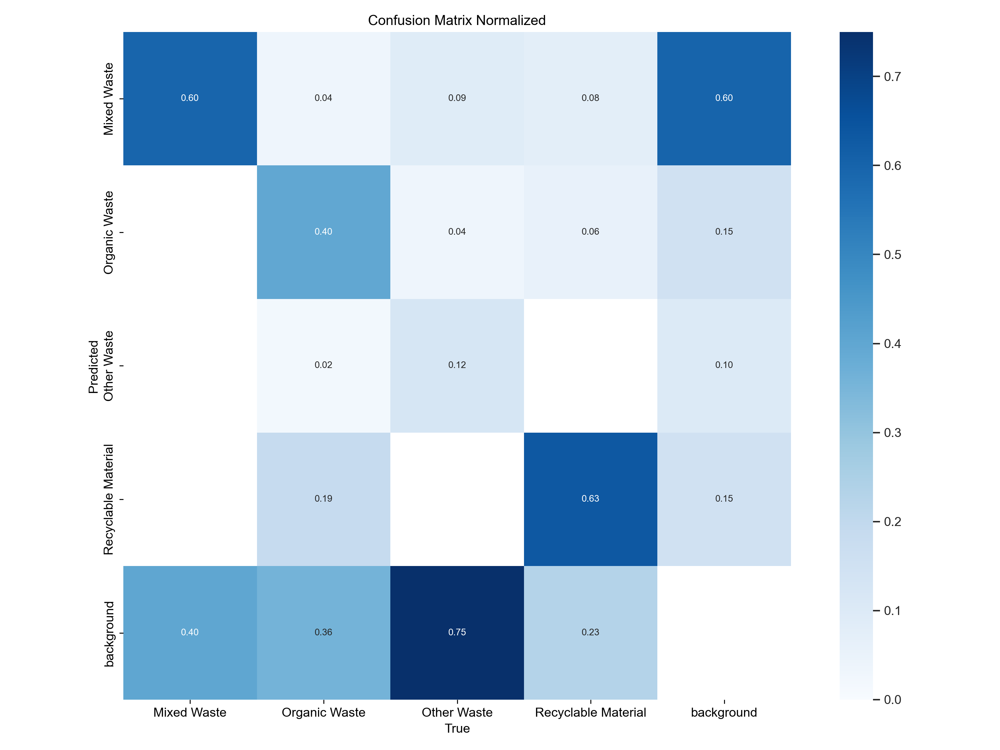

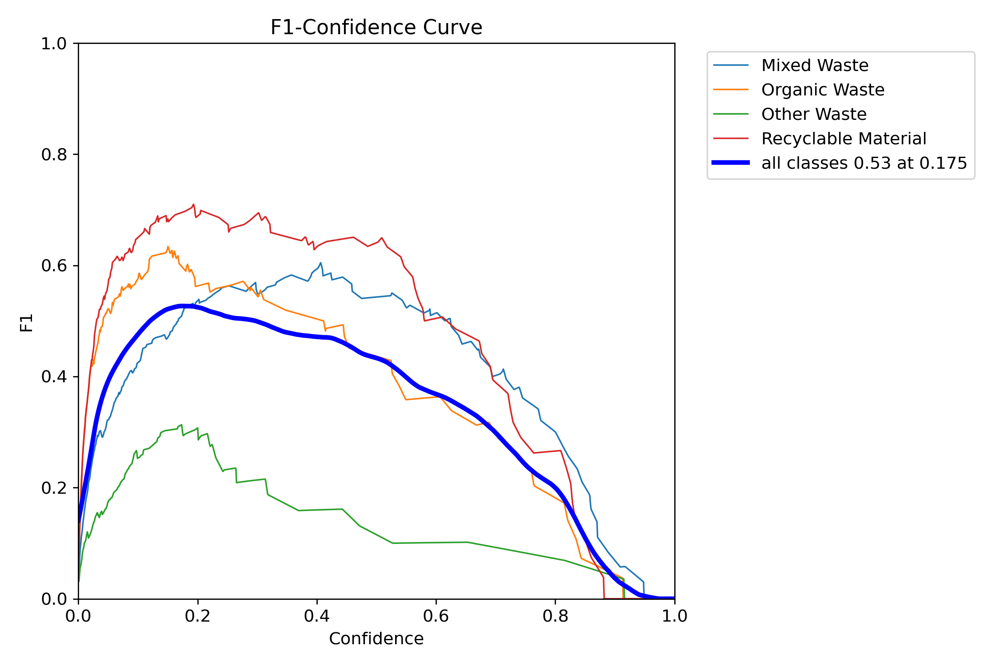

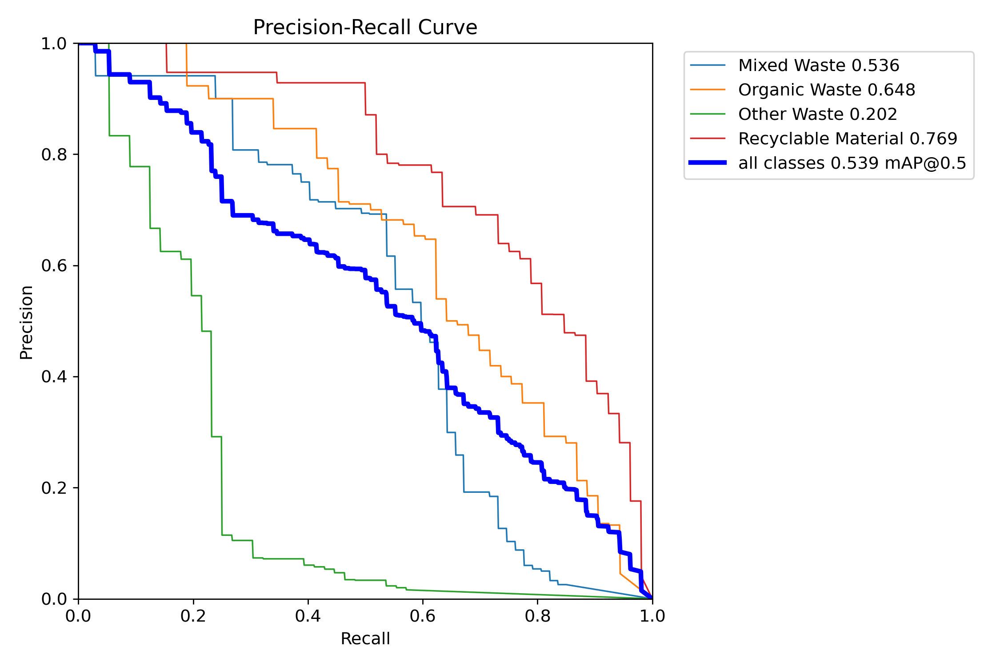

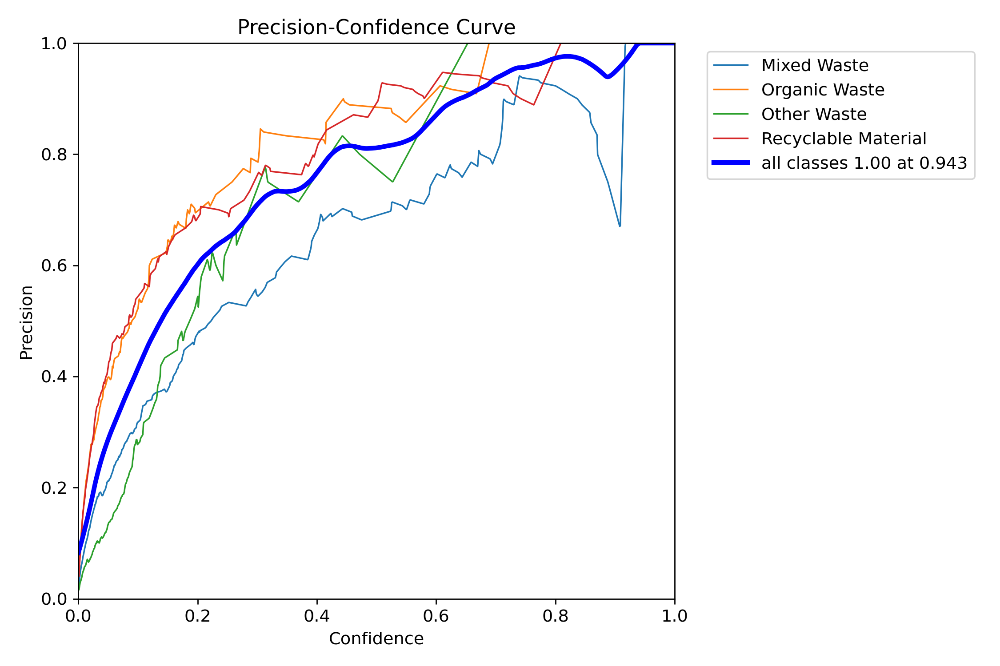

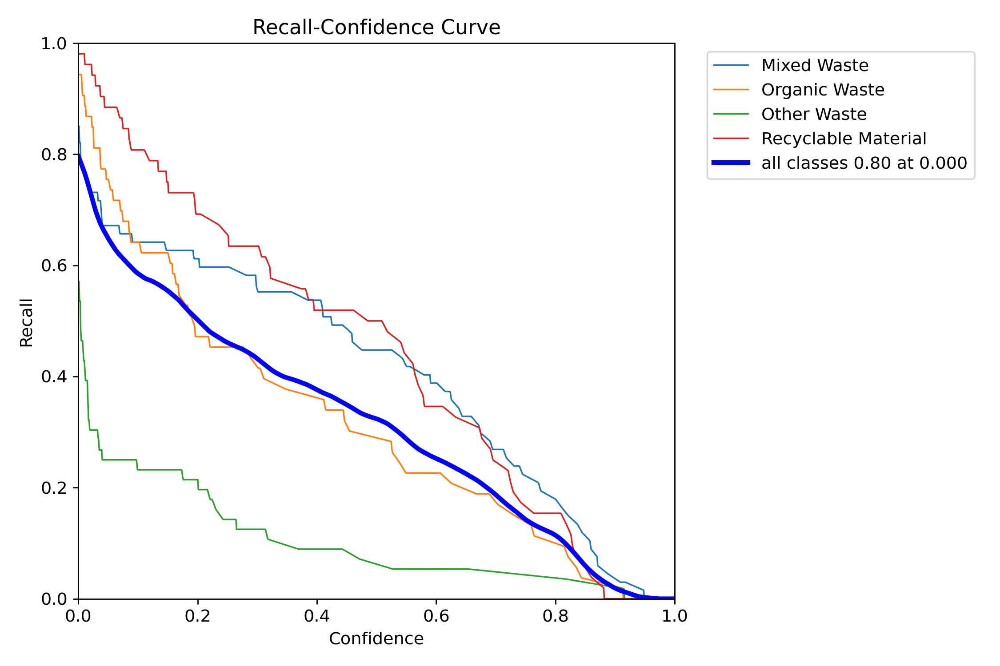

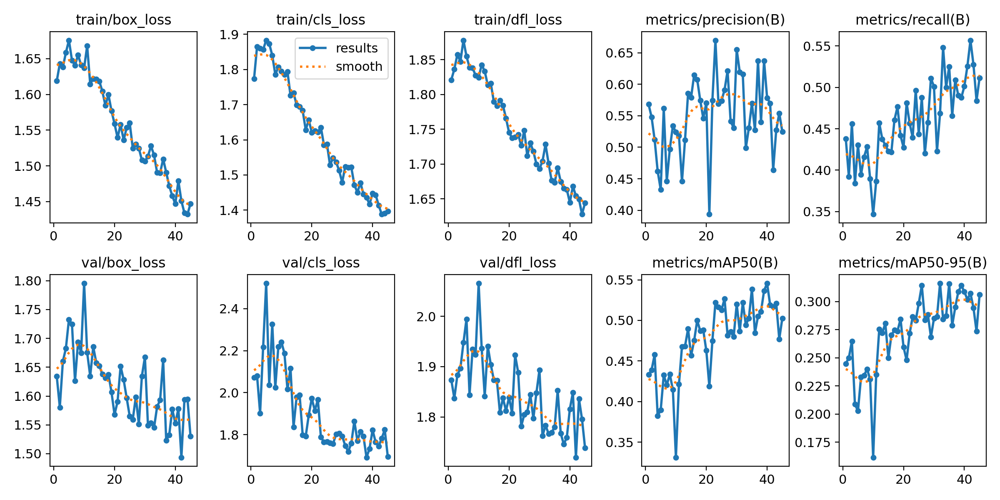

In [4]:
# Path to the "runs/detect" folder
detect_folder_path = os.path.join(os.getcwd(), "runs", "detect")

# Get all folders ending with "R" and containing "SDM", and sort them in ascending order
folders_ending_with_R = sorted([
    folder for folder in os.listdir(detect_folder_path)
    if folder.endswith("R") and "SDM" in folder and os.path.isdir(os.path.join(detect_folder_path, folder))
])

# Check if there are any folders to choose from
if not folders_ending_with_R:
    print("No Results folders containing 'SDM' found!")
else:
    # Display available folders for user selection
    print("Available folders:")
    for i, folder in enumerate(folders_ending_with_R, start=1):
        print(f"{i}. {folder}")
    
    # Prompt the user to select a folder
    try:
        choice = int(input("Enter the number corresponding to the folder you want to use: "))
        selected_folder = folders_ending_with_R[choice - 1]
    except (ValueError, IndexError):
        print("Invalid selection. Please restart and try again.")
        raise
    
    print(f"\nSelected folder: {selected_folder}")
    # Path to the selected folder
    eval_folder_path = os.path.join(detect_folder_path, selected_folder)

    # List of evaluation images excluding "val_batch" files
    evaluation_images = [
        img for img in os.listdir(eval_folder_path)
        if img.lower().endswith(('.png', '.jpg')) and "val_batch" not in img
    ]

    # Display images
    if not evaluation_images:
        print("No evaluation images found in the selected folder.")
    else:
        for img_file in evaluation_images:
            img_path = os.path.join(eval_folder_path, img_file)
            display(Image(filename=img_path))

    # Path to the non-R version of the selected folder
    non_r_folder = selected_folder.rstrip("R")
    non_r_folder_path = os.path.join(detect_folder_path, non_r_folder)

    # Check and display "results.png" if it exists
    results_png_path = os.path.join(non_r_folder_path, "results.png")
    if os.path.exists(results_png_path):
        display(Image(filename=results_png_path))
    else:
        print("No results.png found in the non-R version of the selected folder.")

This cell serves as the codebase for evaluating YOLOv5 training and validation results. It identifies and selects a version folder within the runs/detect directory based on specific criteria, loads the corresponding results.csv file, and computes both final and average metrics for precision, recall, mAP@50, mAP@50-95, and various losses. The codebase further generates visualisations of key metrics over epochs, including trends in precision, recall, mAP, training and validation losses, learning rate schedules, and loss breakdowns. Additionally, it provides a precision vs recall scatter plot, offering a comprehensive evaluation framework for assessing YOLOv5 model performance.

Available versions:
1. MDD-SDM-Yolov5-v2
2. MDD-SDM-Yolov5-v3
3. MDD-SDM-Yolov5-v4
4. MDD-SDM-Yolov5-v5
5. MDD-SDM-Yolov5_v1
YOLO Model Training & Validation Metrics for Version: MDD-SDM-Yolov5-v3


,Metric,Final Value,Average Value
0,Precision,0.52503,0.550170
1,Recall,0.51151,0.459054
2,mAP@50,0.50250,0.476797
3,mAP@50-95,0.30611,0.272287
4,Train Box Loss,1.44725,1.556195
5,Train Classification Loss,1.39642,1.617128
6,Validation Box Loss,1.53016,1.615458
7,Validation Classification Loss,1.69570,1.908239


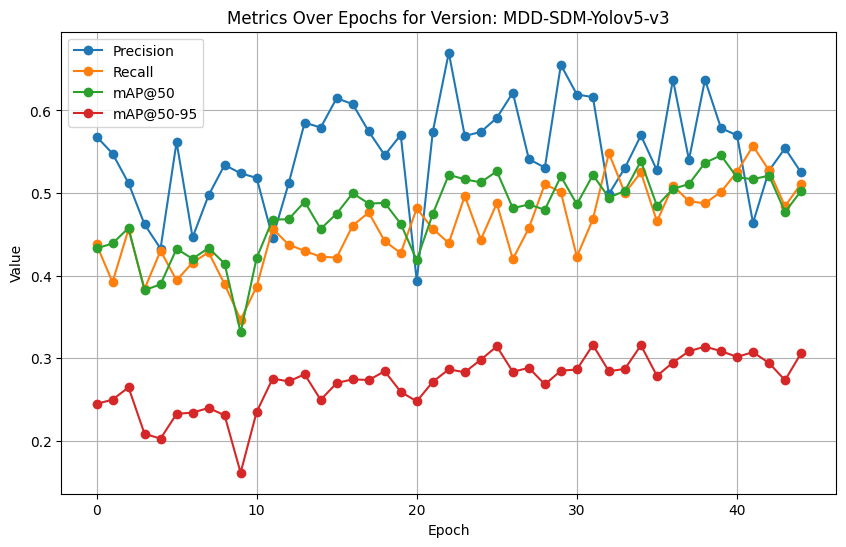

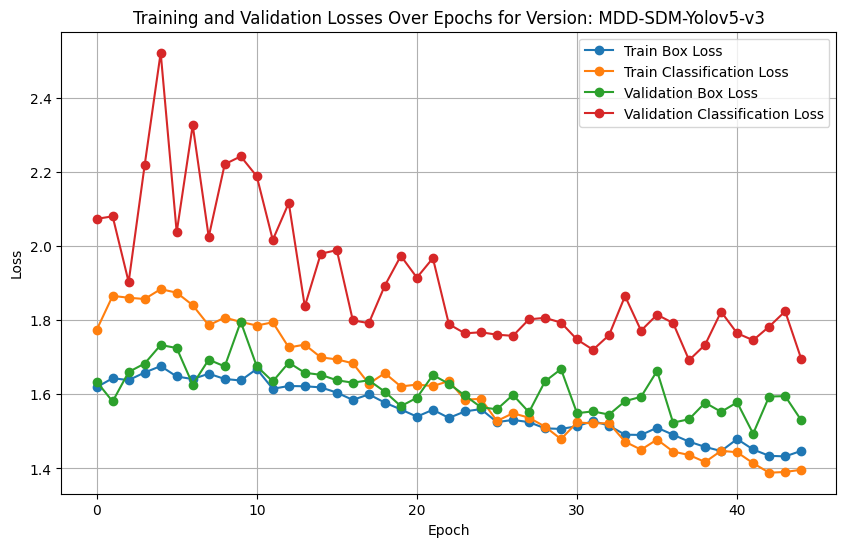

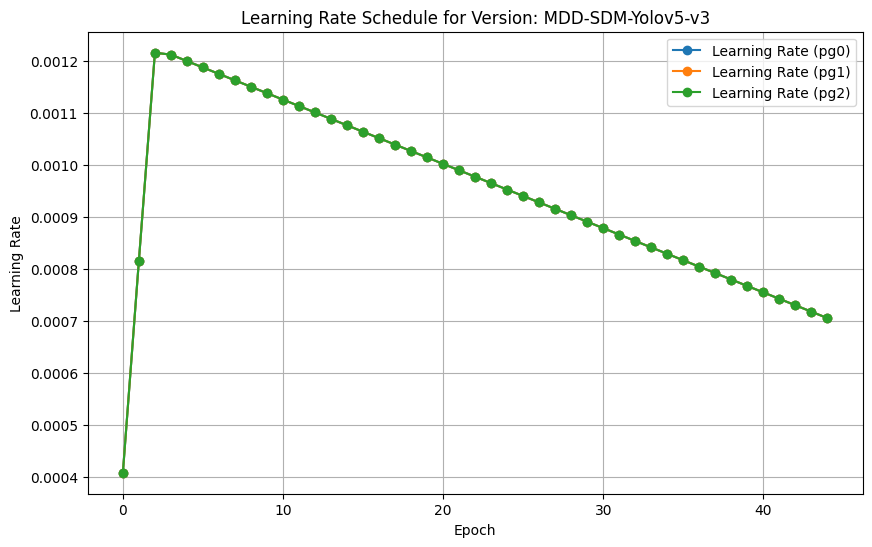

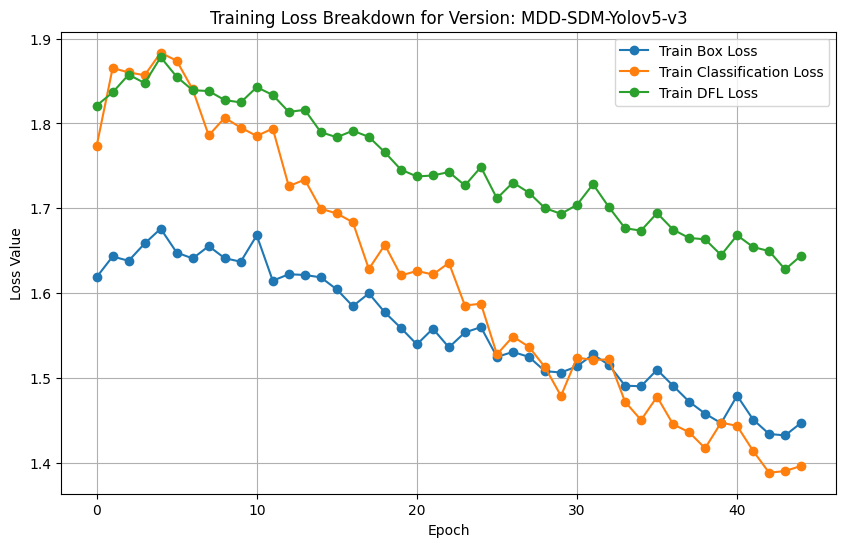

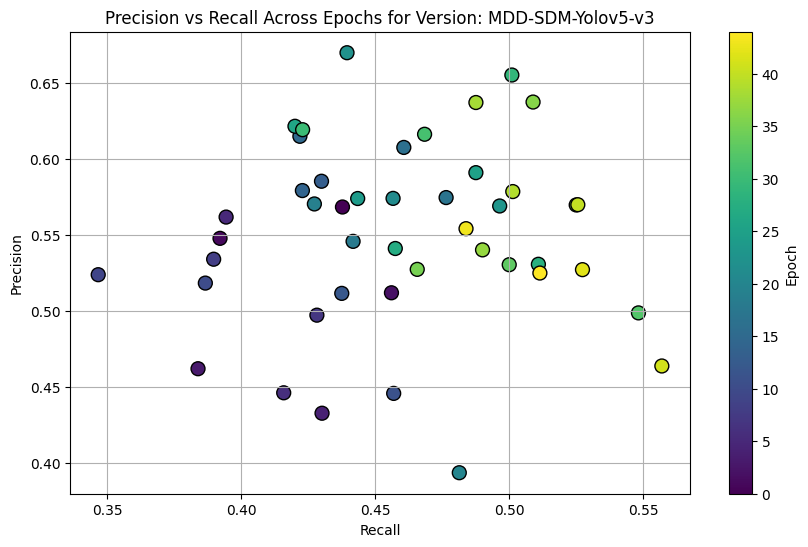

In [5]:
# Path to the "runs/detect" folder
detect_path = os.path.join(os.getcwd(), "runs", "detect")

# Get all available versions containing "SDM" in the "runs/detect" directory & sort in ascending order
available_versions = sorted([
    folder for folder in os.listdir(detect_path)
    if os.path.isdir(os.path.join(detect_path, folder)) and not folder.endswith("R") and "SDM" in folder
])

# Check if there are any valid versions to choose from
if not available_versions:
    raise FileNotFoundError("No valid versions containing 'SDM' found in 'runs/detect'.")

# Display options and prompt user for input
print("Available versions:")
for i, version in enumerate(available_versions, start=1):
    print(f"{i}. {version}")

try:
    selected_index = int(input("Enter the number of the version you want to test: ")) - 1
    if selected_index < 0 or selected_index >= len(available_versions):
        raise ValueError("Invalid selection.")
except ValueError:
    print("Invalid input. Please enter a valid number.")
    raise

# Set the selected version
selected_version = available_versions[selected_index]
weights_path = os.path.join(detect_path, selected_version, "weights", "best.pt")

# Path to the selected version's folder
selected_version_path = os.path.join(detect_path, selected_version)

# Path to results CSV file
results_csv_path = os.path.join(selected_version_path, "results.csv")

# Ensure the file exists
if not os.path.exists(results_csv_path):
    raise FileNotFoundError(f"'results.csv' not found in the selected version: {selected_version_path}")

# Load the CSV file
results_df = pd.read_csv(results_csv_path)

# Compute averages for all metrics and losses
average_metrics = {
    "Metric": [
        "Precision", "Recall", "mAP@50", "mAP@50-95", 
        "Train Box Loss", "Train Classification Loss", 
        "Validation Box Loss", "Validation Classification Loss"
    ],
    "Final Value": [
        results_df['metrics/precision(B)'].iloc[-1],
        results_df['metrics/recall(B)'].iloc[-1],
        results_df['metrics/mAP50(B)'].iloc[-1],
        results_df['metrics/mAP50-95(B)'].iloc[-1],
        results_df['train/box_loss'].iloc[-1],
        results_df['train/cls_loss'].iloc[-1],
        results_df['val/box_loss'].iloc[-1],
        results_df['val/cls_loss'].iloc[-1]
    ],
    "Average Value": [
        results_df['metrics/precision(B)'].mean(),
        results_df['metrics/recall(B)'].mean(),
        results_df['metrics/mAP50(B)'].mean(),
        results_df['metrics/mAP50-95(B)'].mean(),
        results_df['train/box_loss'].mean(),
        results_df['train/cls_loss'].mean(),
        results_df['val/box_loss'].mean(),
        results_df['val/cls_loss'].mean()
    ]
}

# Convert metrics dictionary to DataFrame
metrics_df = pd.DataFrame(average_metrics)

# Display the title and the table
print(f"YOLO Model Training & Validation Metrics for Version: {selected_version}")
display(metrics_df)

# Plot Precision, Recall, mAP@50, and mAP@50-95 over epochs
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['metrics/precision(B)'], label='Precision', marker='o')
plt.plot(results_df.index, results_df['metrics/recall(B)'], label='Recall', marker='o')
plt.plot(results_df.index, results_df['metrics/mAP50(B)'], label='mAP@50', marker='o')
plt.plot(results_df.index, results_df['metrics/mAP50-95(B)'], label='mAP@50-95', marker='o')
plt.title(f"Metrics Over Epochs for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

# Plot Training and Validation Losses over epochs
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['train/box_loss'], label='Train Box Loss', marker='o')
plt.plot(results_df.index, results_df['train/cls_loss'], label='Train Classification Loss', marker='o')
plt.plot(results_df.index, results_df['val/box_loss'], label='Validation Box Loss', marker='o')
plt.plot(results_df.index, results_df['val/cls_loss'], label='Validation Classification Loss', marker='o')
plt.title(f"Training and Validation Losses Over Epochs for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

# Plot Learning Rate Schedule
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['lr/pg0'], label='Learning Rate (pg0)', marker='o')
plt.plot(results_df.index, results_df['lr/pg1'], label='Learning Rate (pg1)', marker='o')
plt.plot(results_df.index, results_df['lr/pg2'], label='Learning Rate (pg2)', marker='o')
plt.title(f"Learning Rate Schedule for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss Breakdown
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['train/box_loss'], label='Train Box Loss', marker='o')
plt.plot(results_df.index, results_df['train/cls_loss'], label='Train Classification Loss', marker='o')
plt.plot(results_df.index, results_df['train/dfl_loss'], label='Train DFL Loss', marker='o')
plt.title(f"Training Loss Breakdown for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("Loss Value")
plt.legend()
plt.grid(True)
plt.show()

# Plot Precision vs. Recall
plt.figure(figsize=(10, 6))
plt.scatter(results_df['metrics/recall(B)'], results_df['metrics/precision(B)'], c=results_df.index, cmap='viridis', s=100, edgecolor='k')
plt.colorbar(label="Epoch")
plt.title(f"Precision vs Recall Across Epochs for Version: {selected_version}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()


This cell defines methods for processing and visualising YOLO detection results. The load_model and load_image methods handle model and image loading, while ensure_rgb ensures correct image formatting. Methods like display_images_side_by_side and crop_and_display_boxes_grouped present detection results by displaying images with bounding boxes and cropping detected regions with class labels. The analyze_detections method provides detailed analytics, including object counts, confidence scores, and visualisations like bar charts and scatter plots. When combined, these techniques make it easier to intuitively assess model performance and detection results.

In [6]:
# Load the model
def load_model(weights_path):
    if not os.path.exists(weights_path):
        raise FileNotFoundError(f"Weights file not found at {weights_path}.")
    return YOLO(weights_path)

# Load the image
def load_image(image_path):
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image file not found at {image_path}.")
    image = cv2.imread(image_path)  # Load image in BGR format
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Ensure images are in RGB format
def ensure_rgb(image):
    if len(image.shape) == 3 and image.shape[2] == 3:  # Check if the image has 3 channels
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB) if not np.array_equal(
            image, cv2.cvtColor(cv2.cvtColor(image, cv2.COLOR_RGB2BGR), cv2.COLOR_BGR2RGB)
        ) else image
    elif len(image.shape) == 2:  # Grayscale image
        return cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)  # Convert grayscale to RGB
    else:
        raise ValueError("Unsupported image format. Image must have 1 (grayscale) or 3 (RGB/BGR) channels.")
    
def display_images_side_by_side(original, predicted, results, confidence_threshold=0.35, titles=("Original Test Image", "Predicted Image with Bounding Boxes")):
    # Ensure both images are in RGB format
    original_rgb = ensure_rgb(original)

    # Filter results to exclude bounding boxes with confidence below threshold
    filtered_boxes = []
    boxes = results[0].boxes  # Access the bounding boxes from the results
    if boxes is not None:
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()  # Extract coordinates
            confidence = box.conf.item()           # Extract confidence as a scalar
            class_id = int(box.cls.item())         # Extract class ID as a scalar
            if confidence >= confidence_threshold:
                filtered_boxes.append((x1, y1, x2, y2, confidence, class_id))

    predicted_rgb = ensure_rgb(predicted)

    # Display images side by side
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title(titles[0])
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_rgb)
    plt.title(titles[1])
    plt.axis("off")
    plt.tight_layout()
    plt.show()

def crop_and_display_boxes_grouped(original_image, results, confidence_threshold=0.36):
    # Get bounding boxes and their corresponding class names
    boxes = results[0].boxes
    confidences = boxes.conf.cpu().numpy()
    class_ids = boxes.cls.cpu().numpy()

    # Initialize a list to store cropped images
    cropped_images = []
    cropped_titles = []

    # Loop through each bounding box and crop the region
    for i, (box, confidence, class_id) in enumerate(zip(boxes, confidences, class_ids)):
        if confidence >= confidence_threshold:
            # Get the coordinates of the bounding box
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            
            # Crop the image around the bounding box
            cropped_image = original_image[int(y1):int(y2), int(x1):int(x2)]
            
            # Map class ID to class name
            class_name = model.names[int(class_id)]

            # Store the cropped image and its title
            cropped_images.append(cropped_image)
            cropped_titles.append(f"{class_name} - Conf: {confidence:.2f}")

    # If there are cropped images, display them in a grid
    if cropped_images:
        num_images = len(cropped_images)
        grid_size = int(np.ceil(np.sqrt(num_images)))  # Calculate grid size for display

        # Plot cropped images in a grid
        plt.figure(figsize=(grid_size * 3, grid_size * 3))
        for i, (cropped_image, title) in enumerate(zip(cropped_images, cropped_titles)):
            plt.subplot(grid_size, grid_size, i + 1)
            plt.imshow(cropped_image)
            plt.title(title)
            plt.axis("off")
        plt.tight_layout()
        plt.show()

def crop_and_display_boxes_grouped(original_image, results, confidence_threshold=0.36):
    # Get bounding boxes and their corresponding class names
    boxes = results[0].boxes
    confidences = boxes.conf.cpu().numpy()
    class_ids = boxes.cls.cpu().numpy()

    # Initialize a list to store cropped images
    cropped_images = []
    cropped_titles = []

    # Loop through each bounding box and crop the region
    for i, (box, confidence, class_id) in enumerate(zip(boxes, confidences, class_ids)):
        if confidence >= confidence_threshold:
            # Get the coordinates of the bounding box
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            
            # Crop the image around the bounding box
            cropped_image = original_image[int(y1):int(y2), int(x1):int(x2)]
            
            # Map class ID to class name
            class_name = model.names[int(class_id)]

            # Store the cropped image and its title
            cropped_images.append(cropped_image)
            cropped_titles.append(f"{class_name} - Conf: {confidence:.2f}")

    # If there are cropped images, display them in a grid
    if cropped_images:
        num_images = len(cropped_images)
        grid_size = int(np.ceil(np.sqrt(num_images)))  # Calculate grid size for display

        # Plot cropped images in a grid
        plt.figure(figsize=(grid_size * 3, grid_size * 3))
        for i, (cropped_image, title) in enumerate(zip(cropped_images, cropped_titles)):
            plt.subplot(grid_size, grid_size, i + 1)
            plt.imshow(cropped_image)
            plt.title(title)
            plt.axis("off")
        plt.tight_layout()
        plt.show()

def analyze_detections(results, model):
    # Get detected boxes and classes
    boxes = results[0].boxes  # Bounding box tensor
    num_objects = len(boxes)  # Total number of detected objects

    if num_objects == 0:
        print("No (0) objects detected in the image.")
        return

    # Extract class IDs and confidence scores
    class_ids = boxes.cls.cpu().numpy()
    confidences = boxes.conf.cpu().numpy()

    # Map class IDs to class names using model's class names
    class_names = [model.names[int(cls_id)] for cls_id in class_ids]

    # Define fixed classes (ensure consistency in bar chart even if some classes are missing)
    fixed_classes = ["Mixed Waste", "Organic Waste", "Other Waste", "Recyclable Material"]
    class_counts = {class_name: 0 for class_name in fixed_classes}
    for class_name in class_names:
        if class_name in class_counts:
            class_counts[class_name] += 1

    # Display analytics
    print("\n=== Image Analytics ===")
    print(f"Total Objects Detected: {num_objects}")
    print("Object Breakdown:")
    for class_name, count in class_counts.items():
        print(f"  - {class_name}: {count}")
    print("Confidence Scores:")
    for i, (class_name, confidence) in enumerate(zip(class_names, confidences)):
        print(f"  {i + 1}. {class_name} - Confidence: {confidence:.2f}")

    # Plot bar chart for class counts
    colors = {
        "Mixed Waste": "lightcoral",  # Pastel red
        "Organic Waste": "lightgreen",  # Pastel green
        "Other Waste": "sandybrown",  # Pastel orange
        "Recyclable Material": "lightskyblue"  # Pastel blue
    }
    
    plt.figure(figsize=(8, 5))
    plt.bar(class_counts.keys(), class_counts.values(), color=[colors[class_name] for class_name in class_counts.keys()])
    plt.title('Object Count per Class')
    plt.xlabel('Classes')
    plt.ylabel('Count')
    plt.yticks(range(0, max(class_counts.values()) + 2, 1))  # Ensure y-axis increments by 1
    plt.show()

    # Scatter plot for confidence scores
    plt.figure(figsize=(10, 6))
    scatter_colors = [colors[class_name] for class_name in class_names]
    plt.scatter(class_names, confidences, c=scatter_colors, alpha=0.7, edgecolor='k')
    plt.title('Confidence Scores by Class')
    plt.xlabel('Classes')
    plt.ylabel('Confidence Scores')
    plt.ylim(0, 1.05)  # Confidence scores range from 0 to 1
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


This cell handles object detection on test images using the trained YOLOv5 model selected earlier. It validates the test folder and retrieves all valid image files. The chosen model is loaded from its specified weights file, and each test image is processed iteratively. Predictions are made for each image, with detections filtered based on a confidence threshold of 0.35. The original and predicted images are displayed side by side, highlighting bounding boxes on detected objects. Detection analytics, including object counts and confidence scores, are computed and visualised through bar charts and scatter plots. Detected bounding boxes are also cropped and displayed in a grouped grid, providing detailed insights into the detection results for each test image.

Selected weights file: e:\SEAN\Adv_CV\Jupyter Notebooks\runs\detect\MDD-SDM-Yolov5-v3\weights\best.pt
Processing test image: e:\SEAN\Adv_CV\Test\AFL_T1.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T1.jpeg: 640x480 2 Organic Wastes, 58.8ms
Speed: 3.0ms preprocess, 58.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


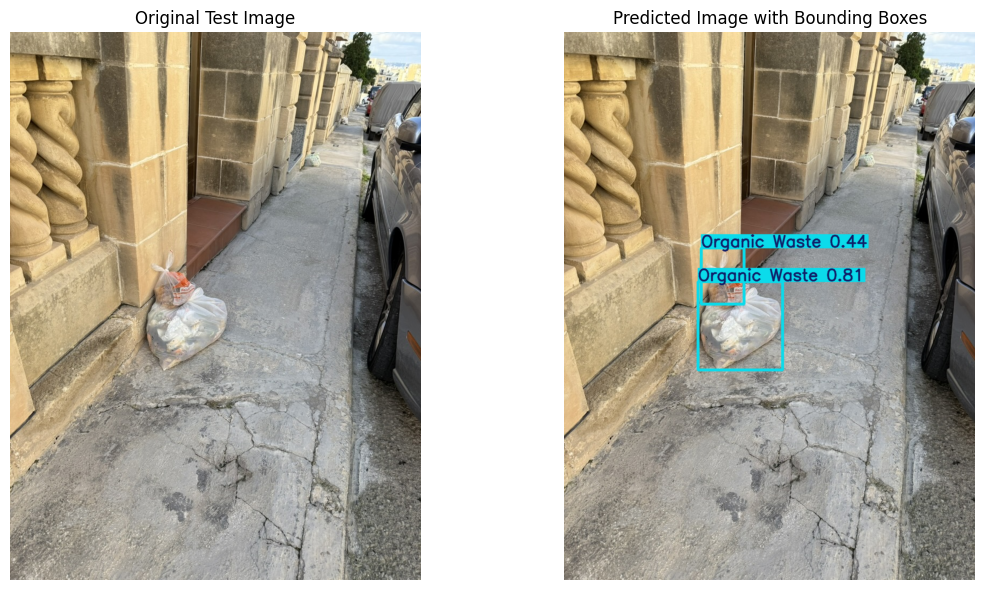


=== Image Analytics ===
Total Objects Detected: 2
Object Breakdown:
  - Mixed Waste: 0
  - Organic Waste: 2
  - Other Waste: 0
  - Recyclable Material: 0
Confidence Scores:
  1. Organic Waste - Confidence: 0.81
  2. Organic Waste - Confidence: 0.44


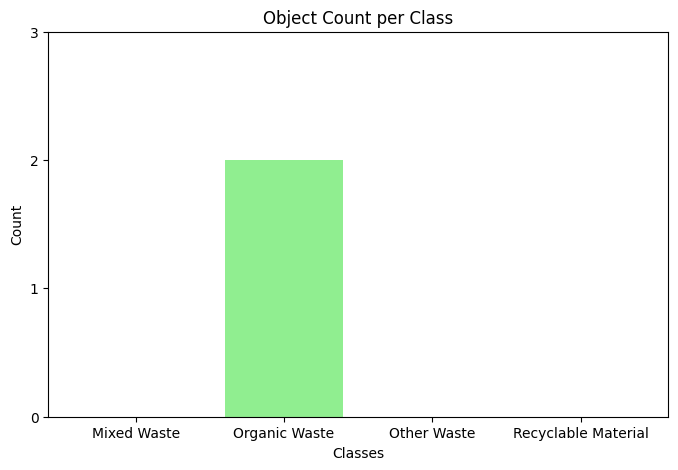

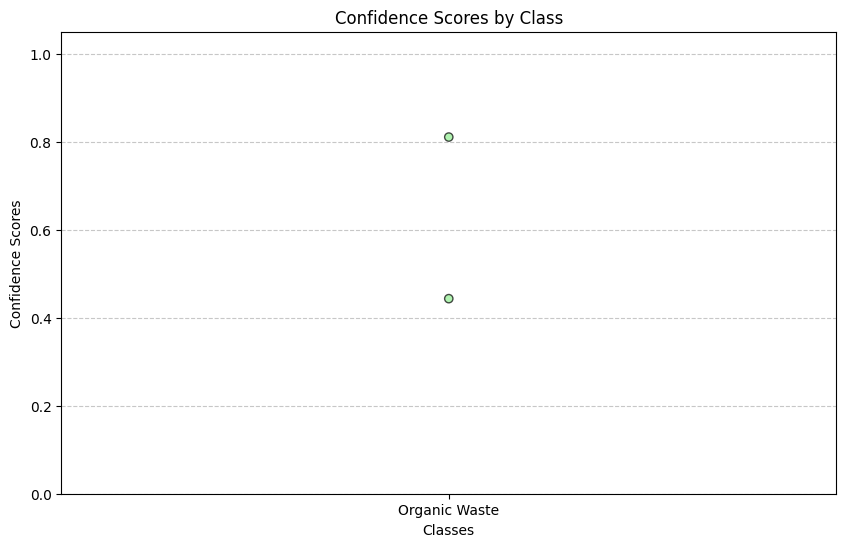

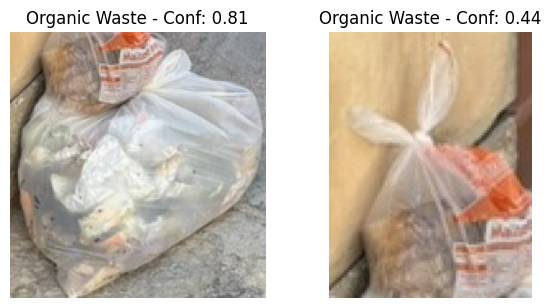

Processing test image: e:\SEAN\Adv_CV\Test\AFL_T1N.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T1N.jpeg: 640x480 1 Mixed Waste, 48.8ms
Speed: 2.0ms preprocess, 48.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


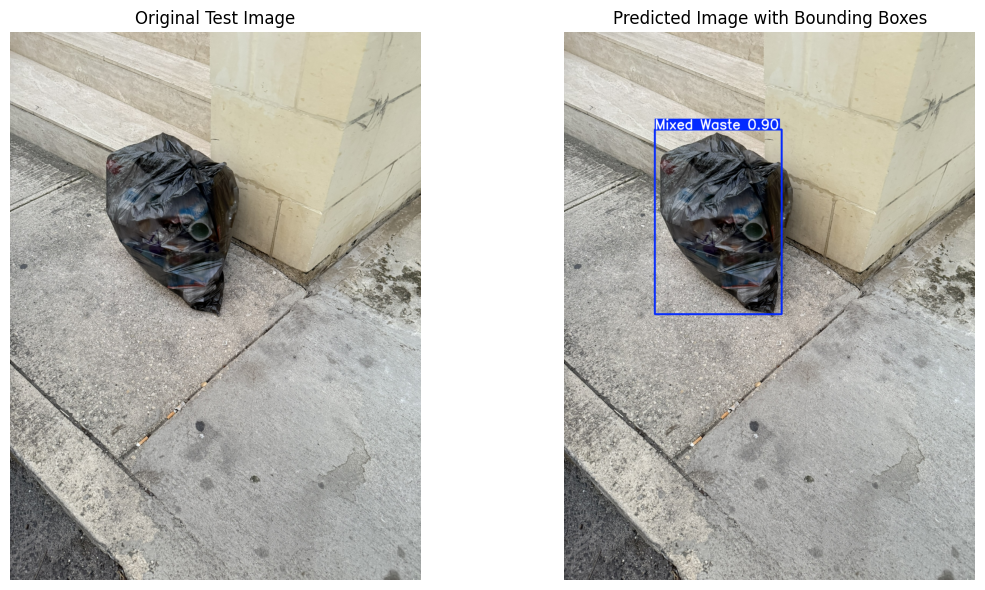


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Mixed Waste: 1
  - Organic Waste: 0
  - Other Waste: 0
  - Recyclable Material: 0
Confidence Scores:
  1. Mixed Waste - Confidence: 0.90


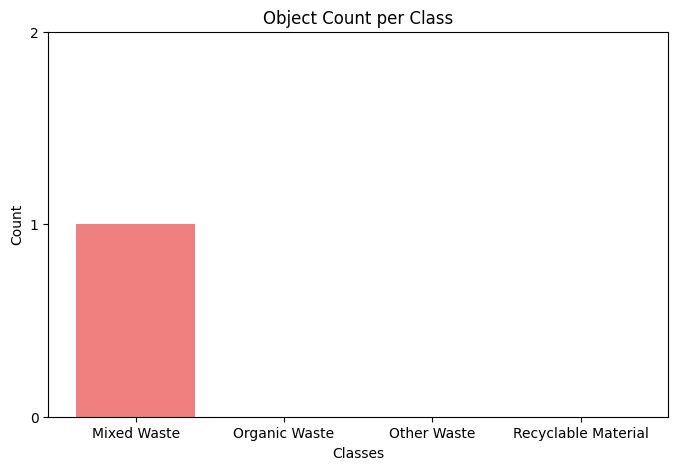

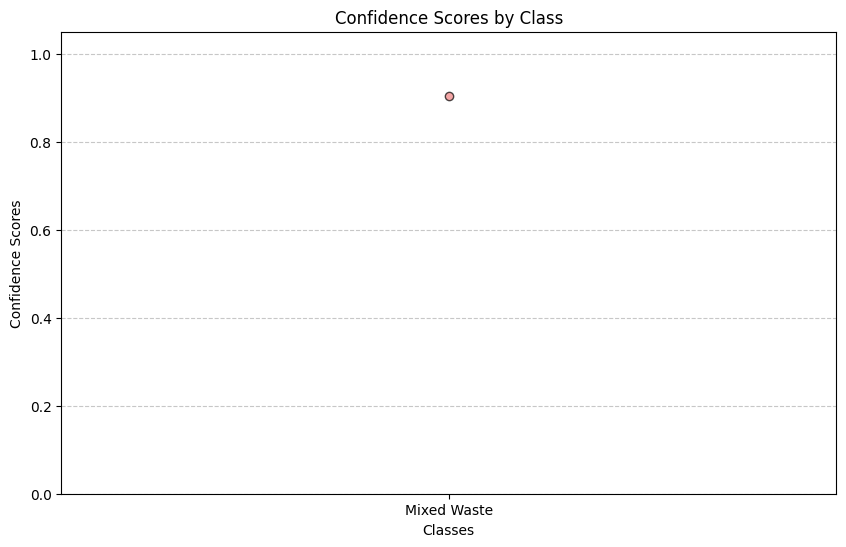

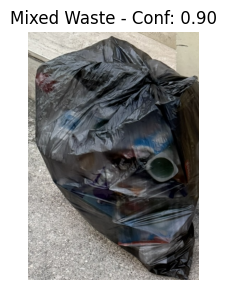

Processing test image: e:\SEAN\Adv_CV\Test\AFL_T2.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T2.jpeg: 640x480 1 Mixed Waste, 47.9ms
Speed: 2.0ms preprocess, 47.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)


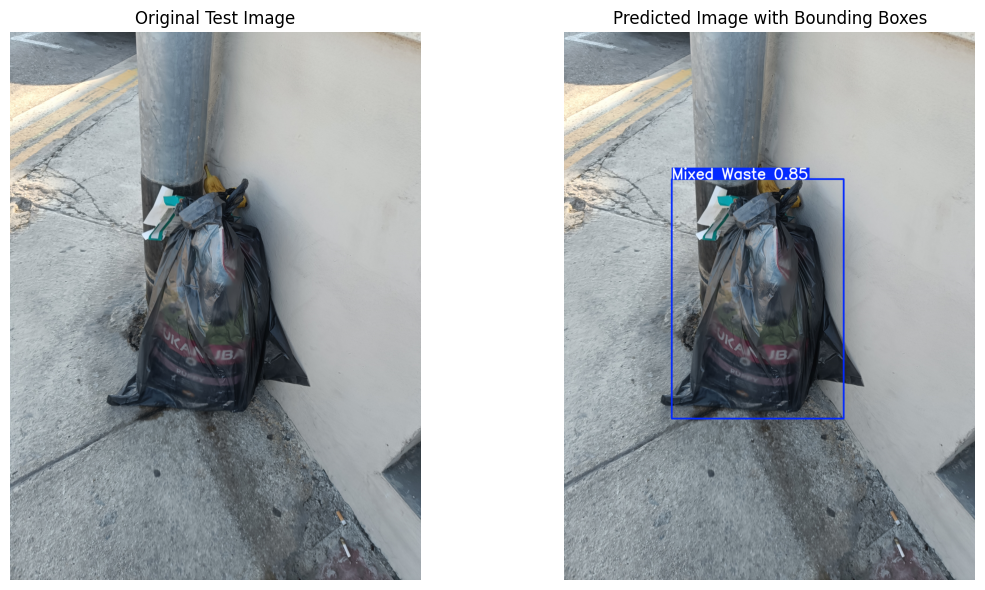


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Mixed Waste: 1
  - Organic Waste: 0
  - Other Waste: 0
  - Recyclable Material: 0
Confidence Scores:
  1. Mixed Waste - Confidence: 0.85


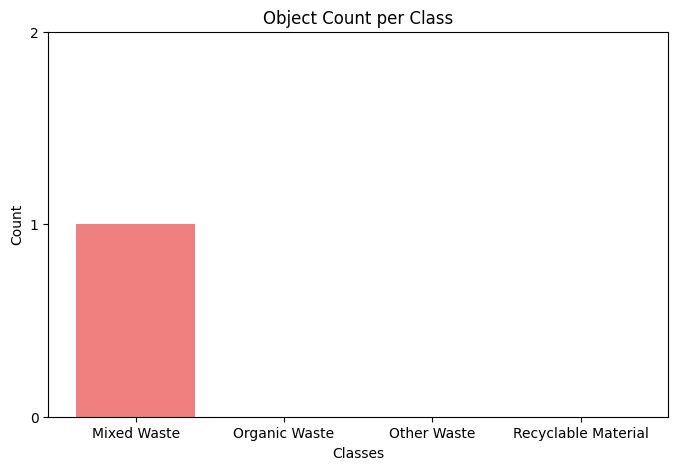

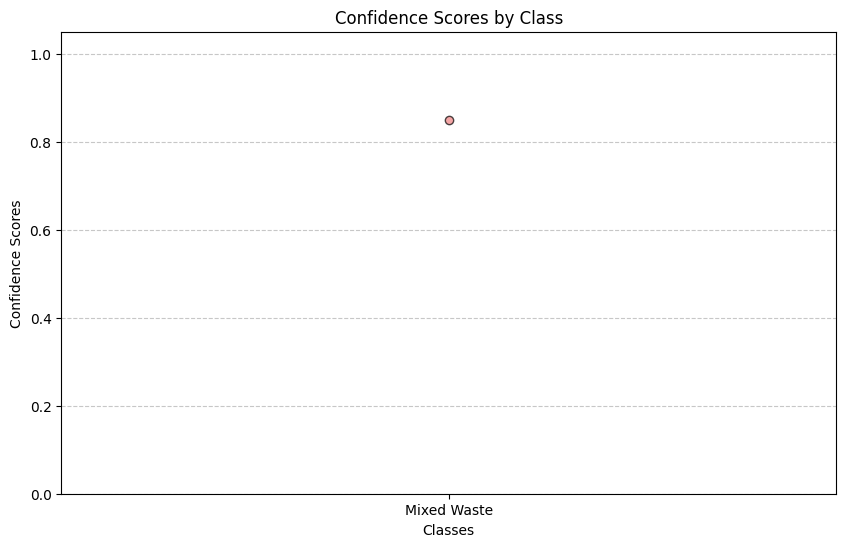

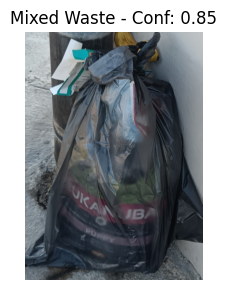

Processing test image: e:\SEAN\Adv_CV\Test\AFL_T2N.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T2N.jpeg: 640x480 (no detections), 52.4ms
Speed: 3.0ms preprocess, 52.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


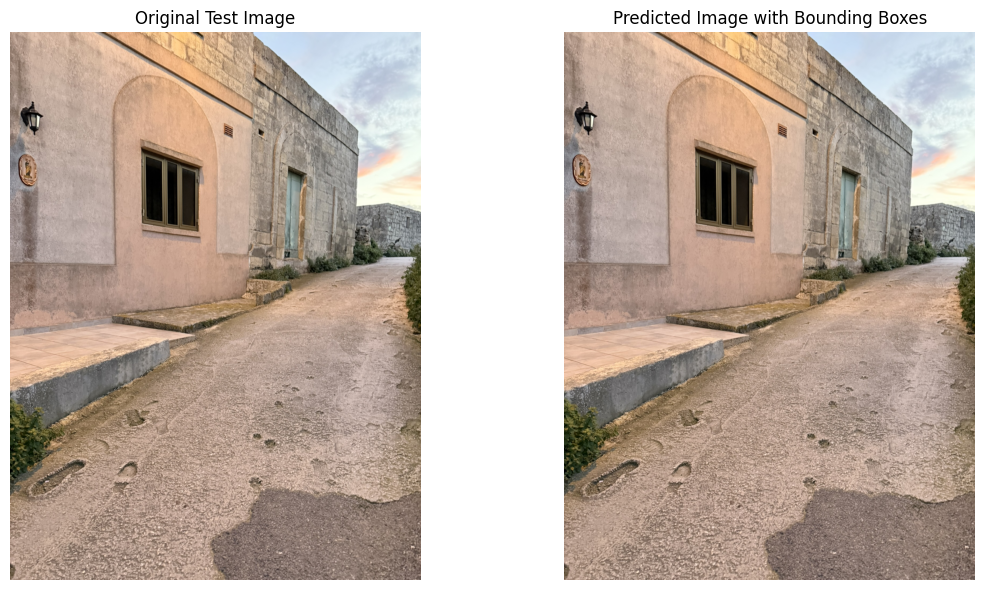

No (0) objects detected in the image.
Processing test image: e:\SEAN\Adv_CV\Test\AFL_T3.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T3.jpeg: 640x480 2 Mixed Wastes, 63.8ms
Speed: 2.0ms preprocess, 63.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


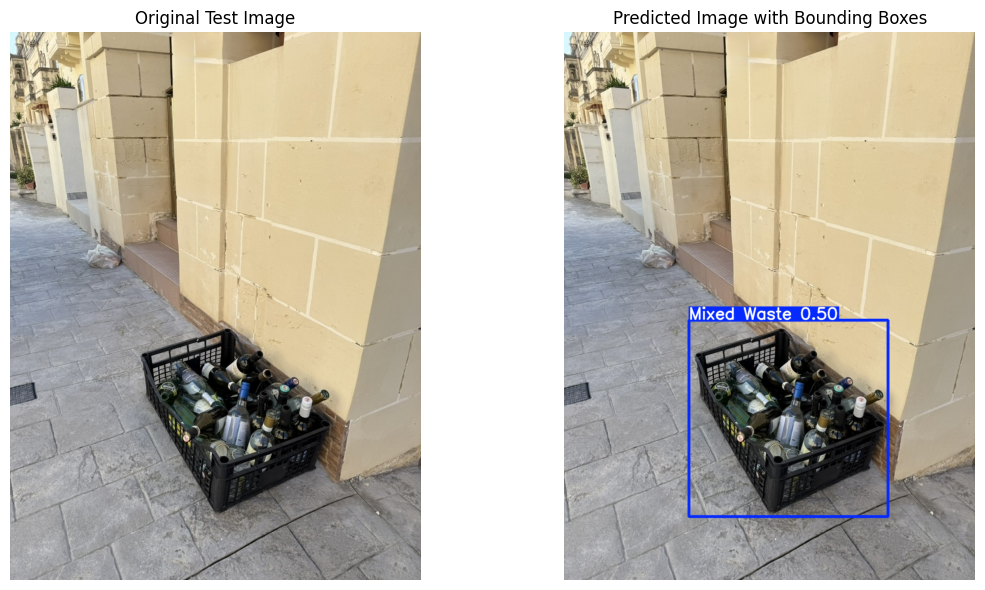


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Mixed Waste: 1
  - Organic Waste: 0
  - Other Waste: 0
  - Recyclable Material: 0
Confidence Scores:
  1. Mixed Waste - Confidence: 0.50


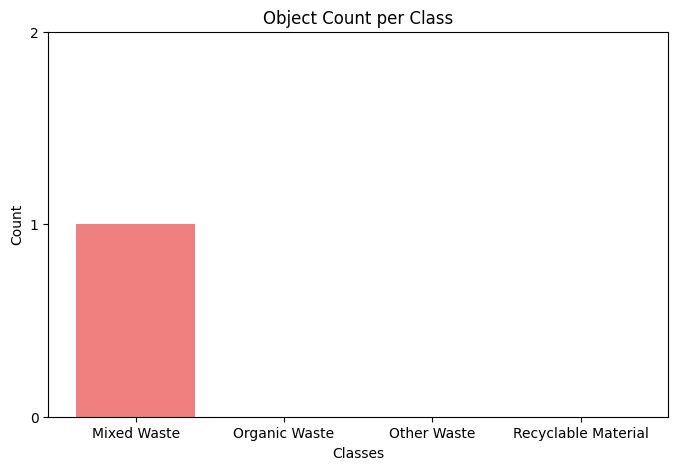

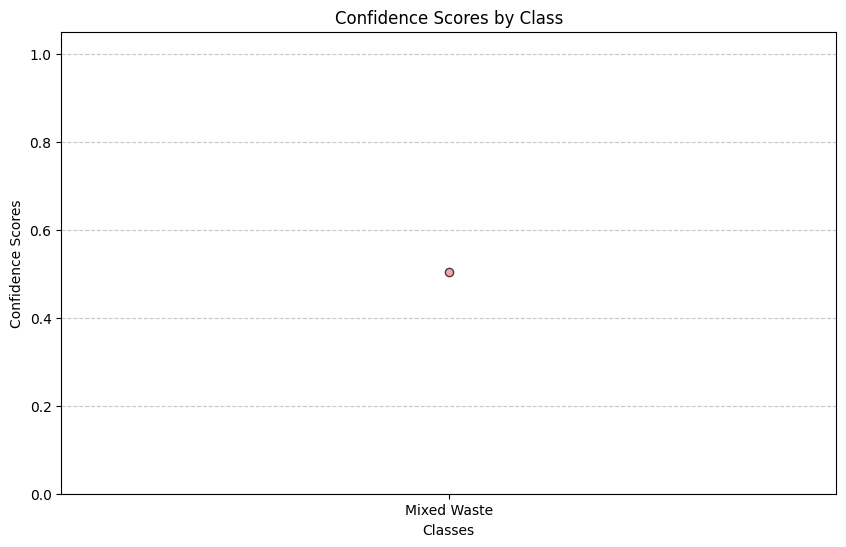

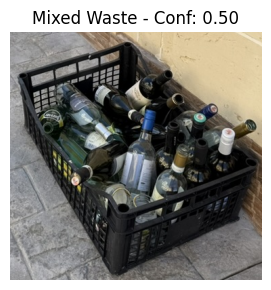

Processing test image: e:\SEAN\Adv_CV\Test\AFL_T3N.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T3N.jpeg: 640x480 3 Mixed Wastes, 1 Other Waste, 51.9ms
Speed: 3.0ms preprocess, 51.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


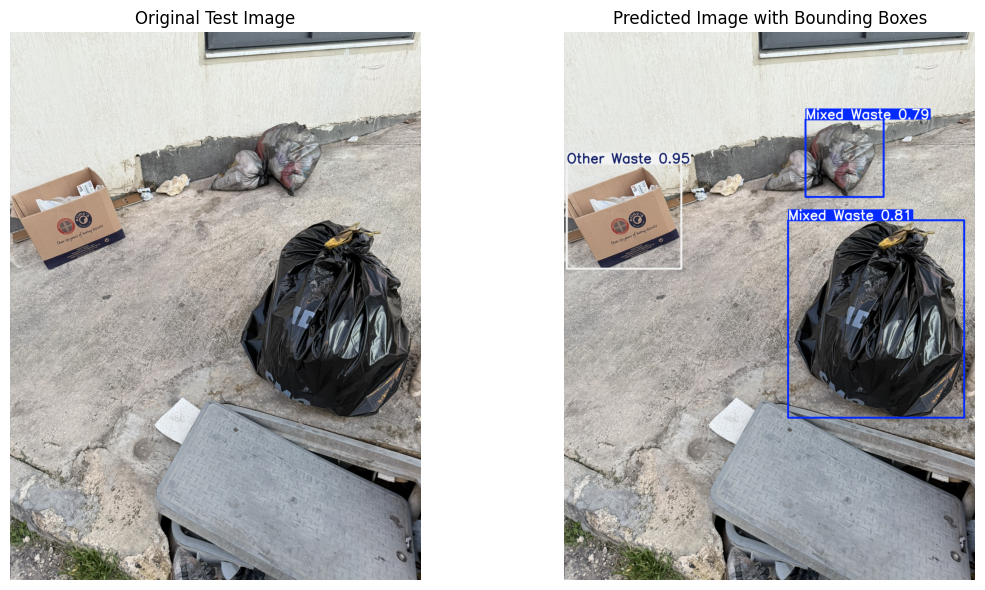


=== Image Analytics ===
Total Objects Detected: 3
Object Breakdown:
  - Mixed Waste: 2
  - Organic Waste: 0
  - Other Waste: 1
  - Recyclable Material: 0
Confidence Scores:
  1. Other Waste - Confidence: 0.95
  2. Mixed Waste - Confidence: 0.81
  3. Mixed Waste - Confidence: 0.79


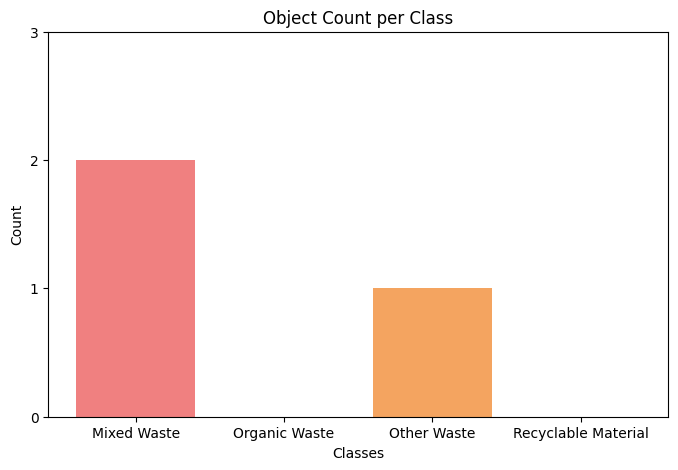

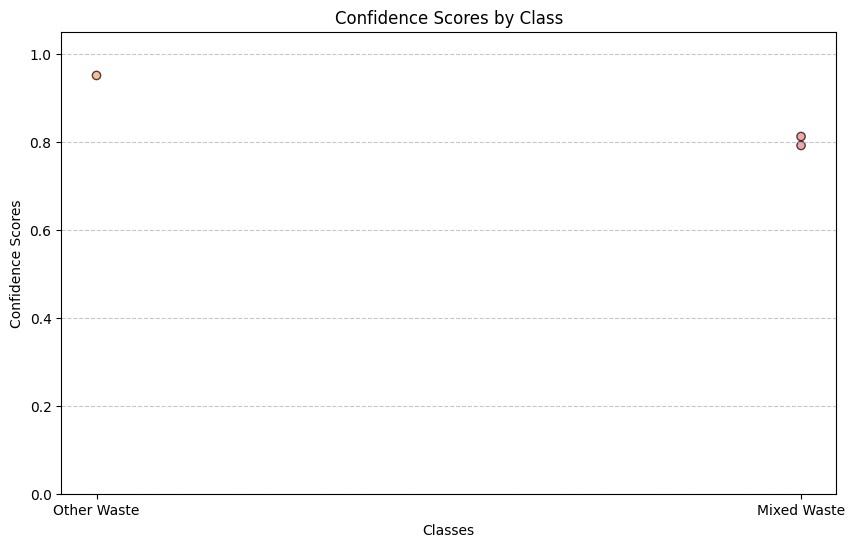

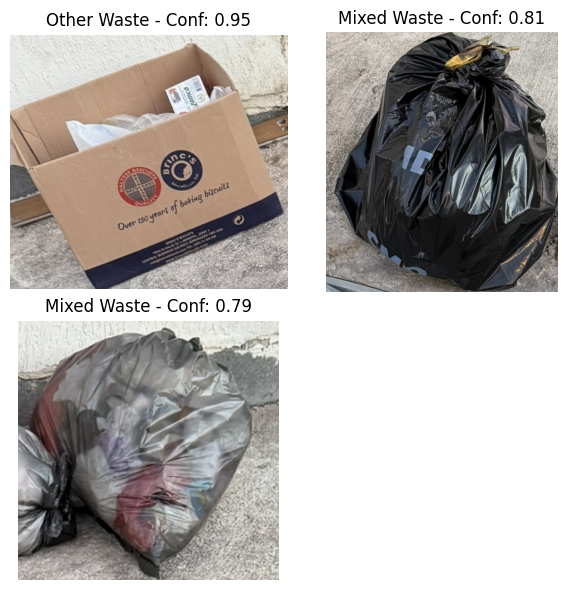

Processing test image: e:\SEAN\Adv_CV\Test\AFL_T4.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T4.jpeg: 640x480 1 Recyclable Material, 50.9ms
Speed: 3.0ms preprocess, 50.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)


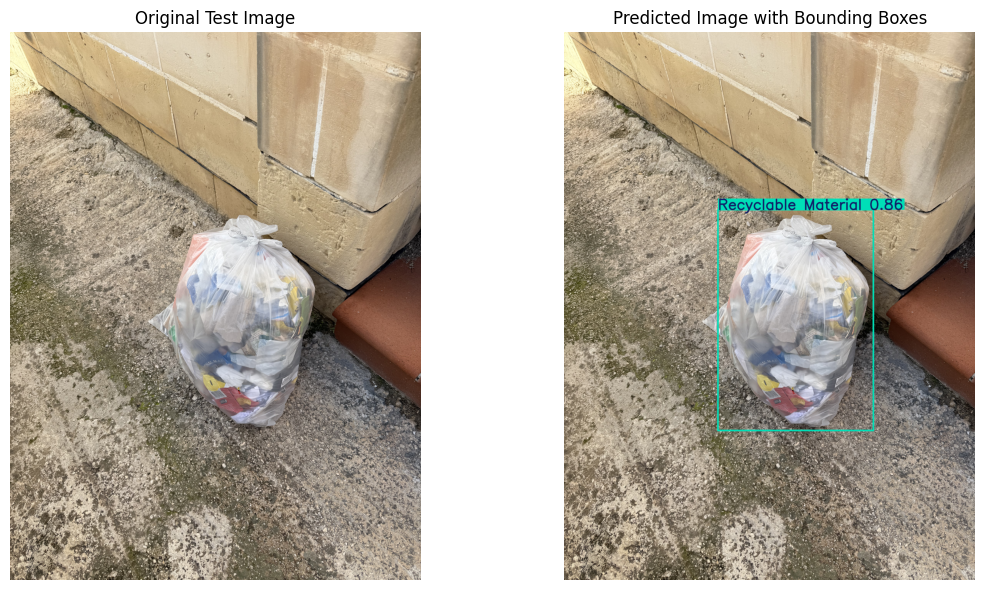


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Mixed Waste: 0
  - Organic Waste: 0
  - Other Waste: 0
  - Recyclable Material: 1
Confidence Scores:
  1. Recyclable Material - Confidence: 0.86


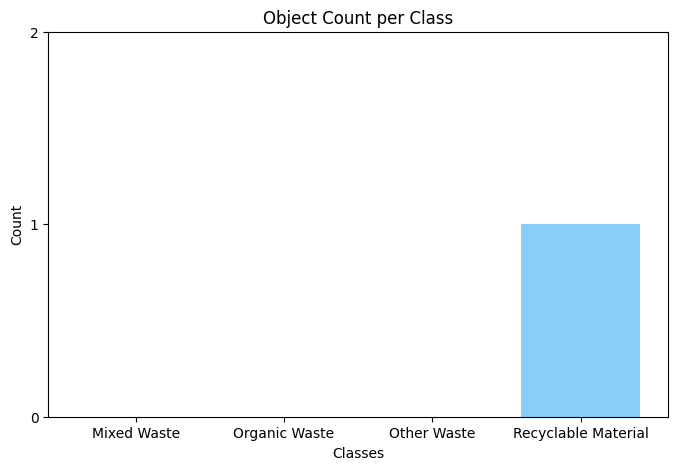

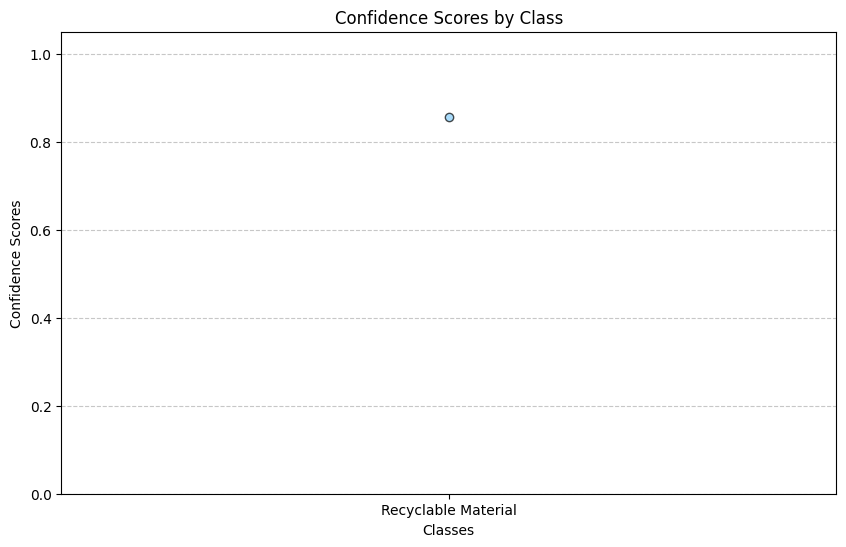

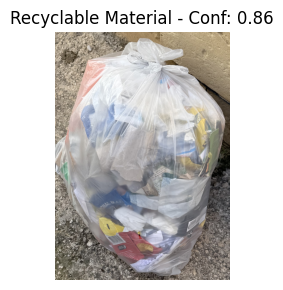

Processing test image: e:\SEAN\Adv_CV\Test\AFL_T4N.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T4N.jpeg: 416x640 1 Mixed Waste, 1 Organic Waste, 110.2ms
Speed: 2.0ms preprocess, 110.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


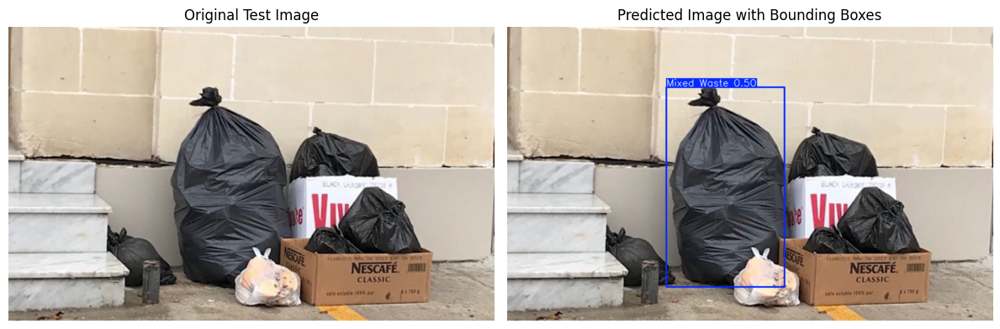


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Mixed Waste: 1
  - Organic Waste: 0
  - Other Waste: 0
  - Recyclable Material: 0
Confidence Scores:
  1. Mixed Waste - Confidence: 0.50


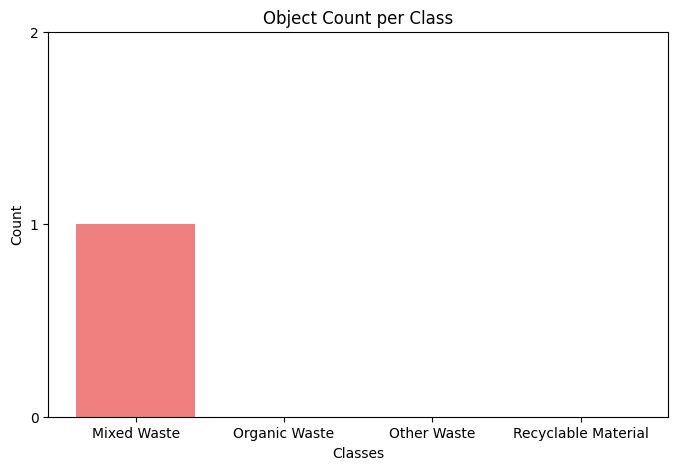

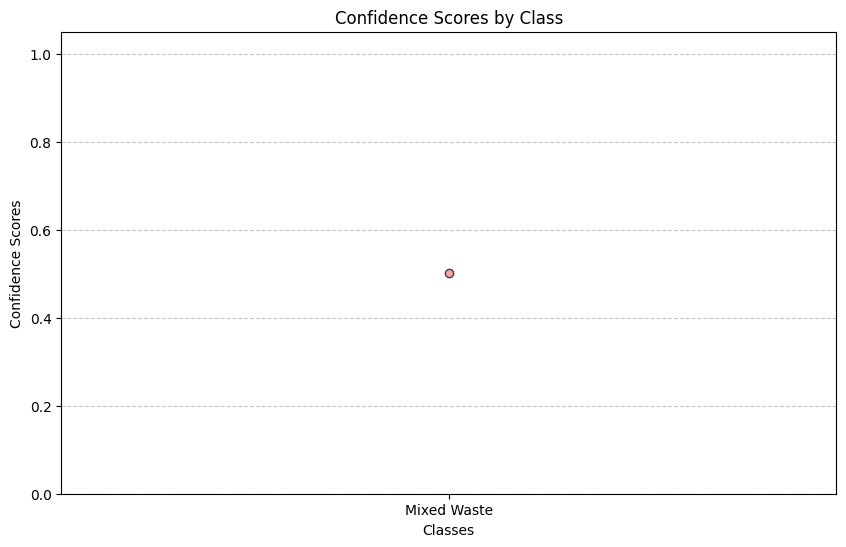

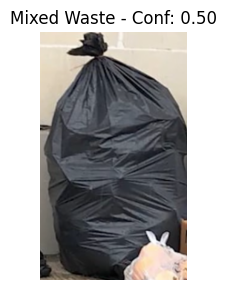

Processing test image: e:\SEAN\Adv_CV\Test\AFL_T5.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T5.jpeg: 640x480 1 Organic Waste, 2 Recyclable Materials, 130.2ms
Speed: 2.0ms preprocess, 130.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


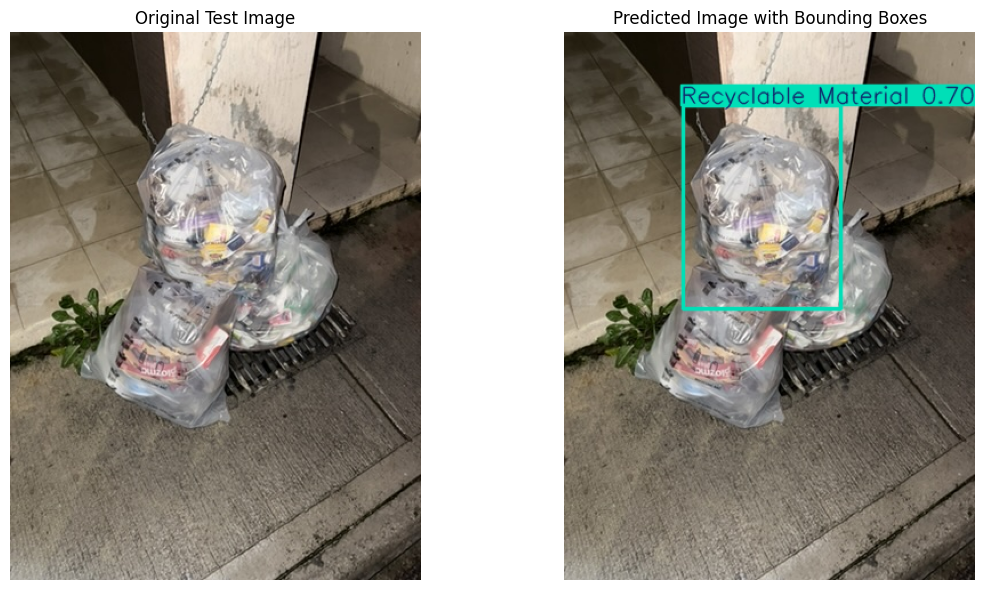


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Mixed Waste: 0
  - Organic Waste: 0
  - Other Waste: 0
  - Recyclable Material: 1
Confidence Scores:
  1. Recyclable Material - Confidence: 0.70


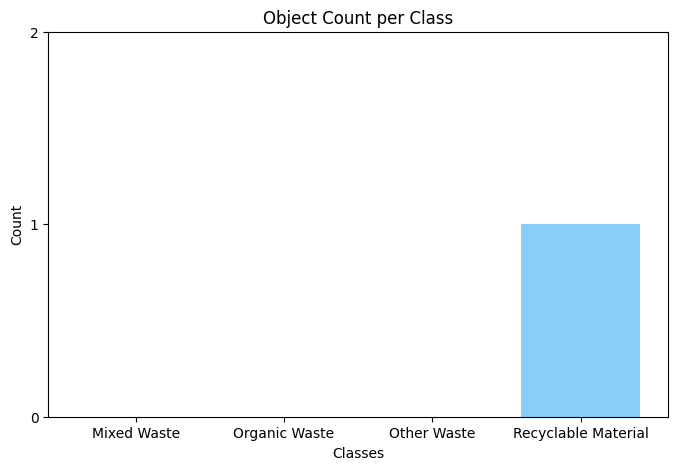

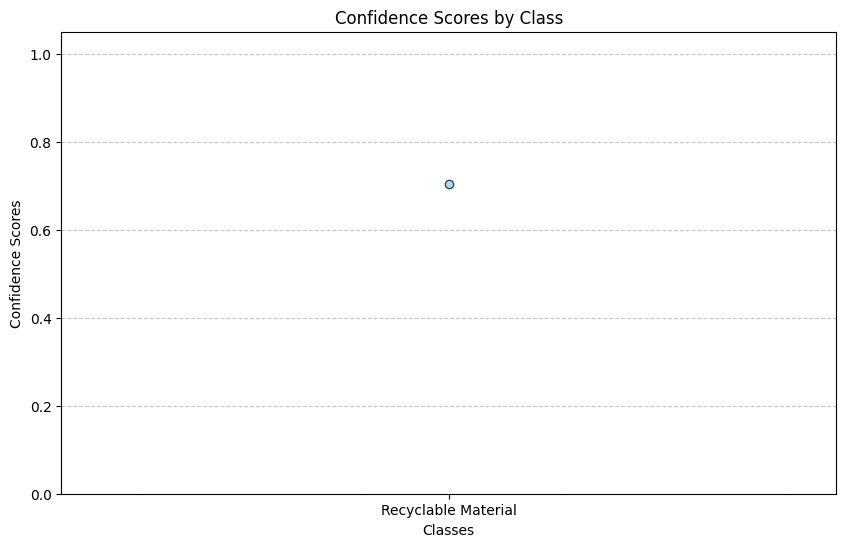

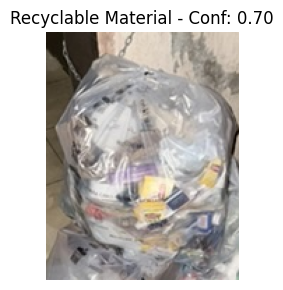

Processing test image: e:\SEAN\Adv_CV\Test\AFL_T5N.jpeg

image 1/1 e:\SEAN\Adv_CV\Test\AFL_T5N.jpeg: 640x480 1 Mixed Waste, 107.7ms
Speed: 2.0ms preprocess, 107.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)


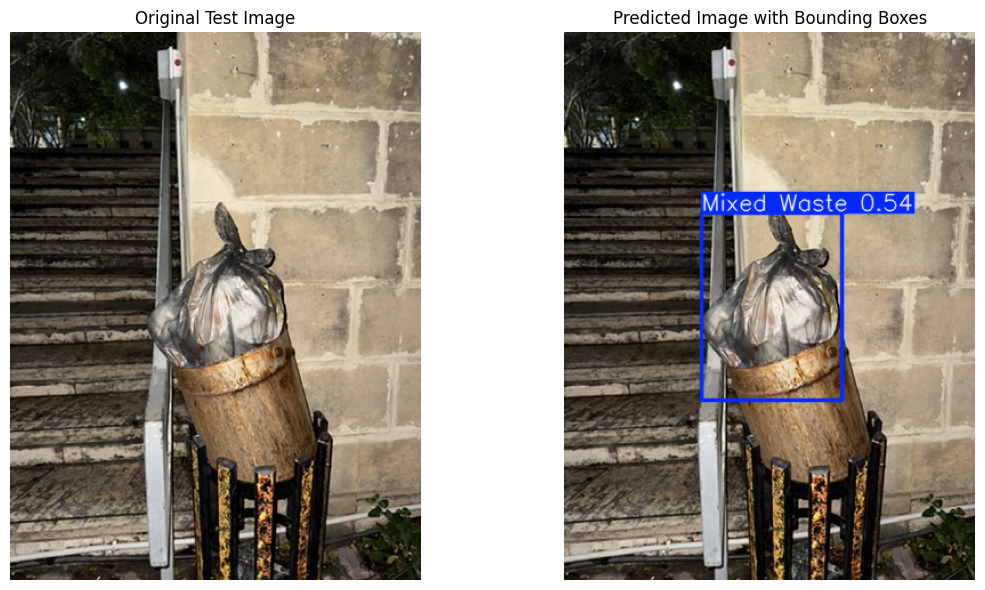


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Mixed Waste: 1
  - Organic Waste: 0
  - Other Waste: 0
  - Recyclable Material: 0
Confidence Scores:
  1. Mixed Waste - Confidence: 0.54


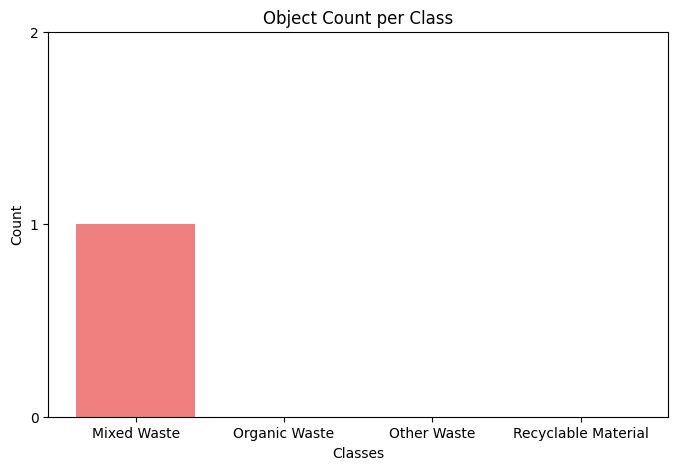

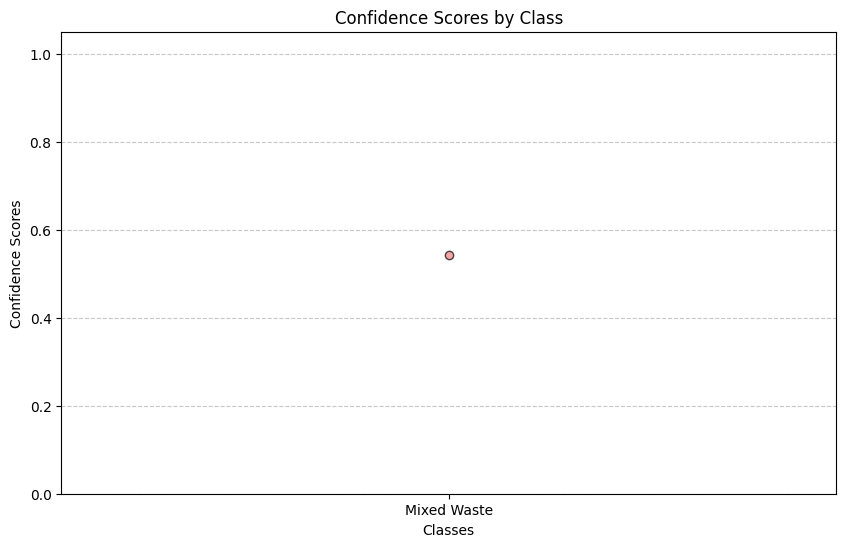

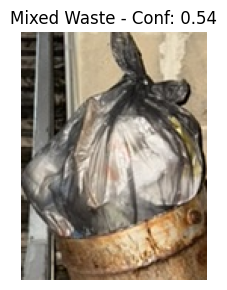

Processing test image: e:\SEAN\Adv_CV\Test\SDM_T1.jpg

image 1/1 e:\SEAN\Adv_CV\Test\SDM_T1.jpg: 640x320 1 Organic Waste, 47.9ms
Speed: 1.0ms preprocess, 47.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 320)


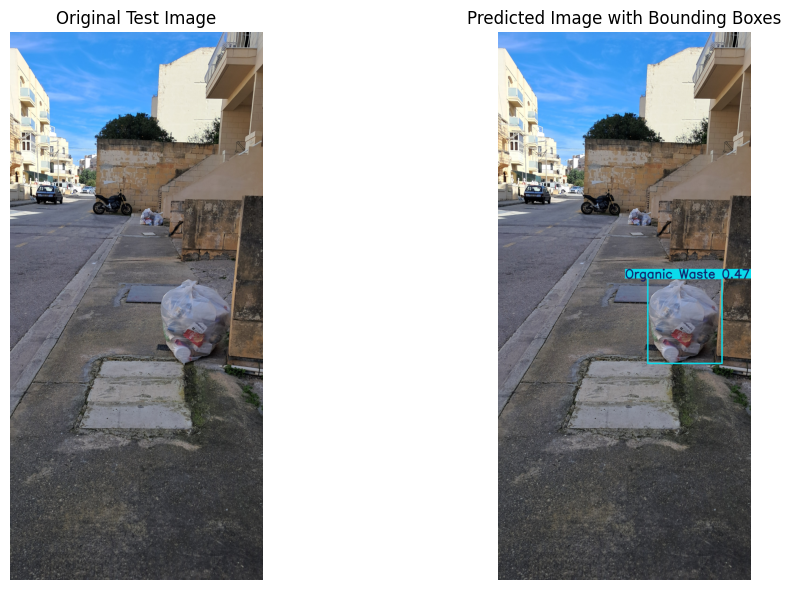


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Mixed Waste: 0
  - Organic Waste: 1
  - Other Waste: 0
  - Recyclable Material: 0
Confidence Scores:
  1. Organic Waste - Confidence: 0.47


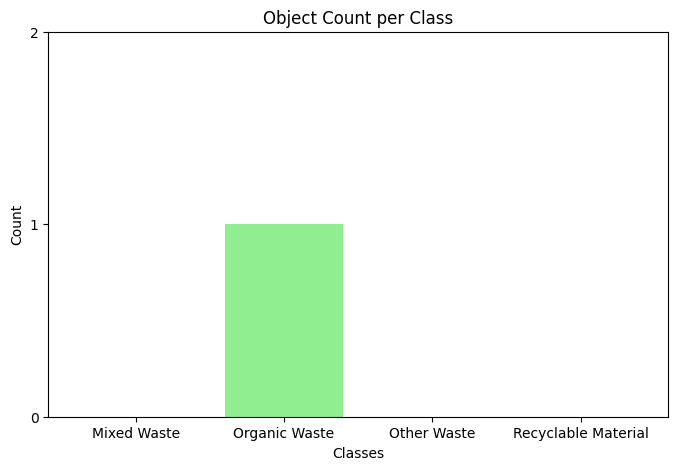

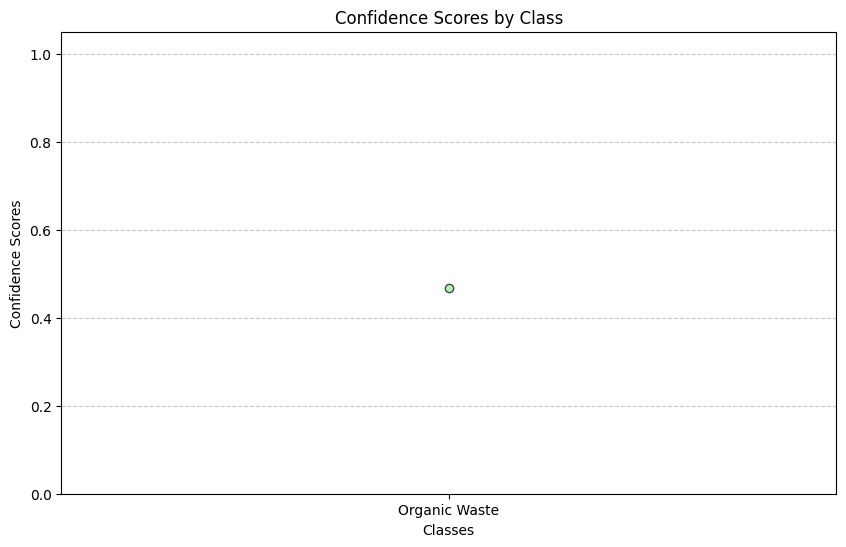

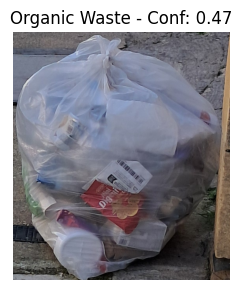

Processing test image: e:\SEAN\Adv_CV\Test\SDM_T2.jpg

image 1/1 e:\SEAN\Adv_CV\Test\SDM_T2.jpg: 640x320 1 Other Waste, 1 Recyclable Material, 36.9ms
Speed: 2.0ms preprocess, 36.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 320)


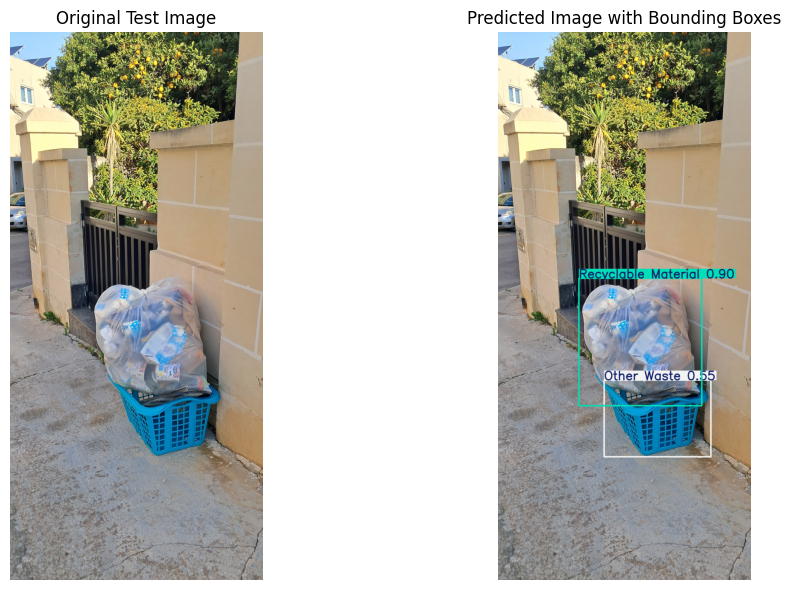


=== Image Analytics ===
Total Objects Detected: 2
Object Breakdown:
  - Mixed Waste: 0
  - Organic Waste: 0
  - Other Waste: 1
  - Recyclable Material: 1
Confidence Scores:
  1. Recyclable Material - Confidence: 0.90
  2. Other Waste - Confidence: 0.55


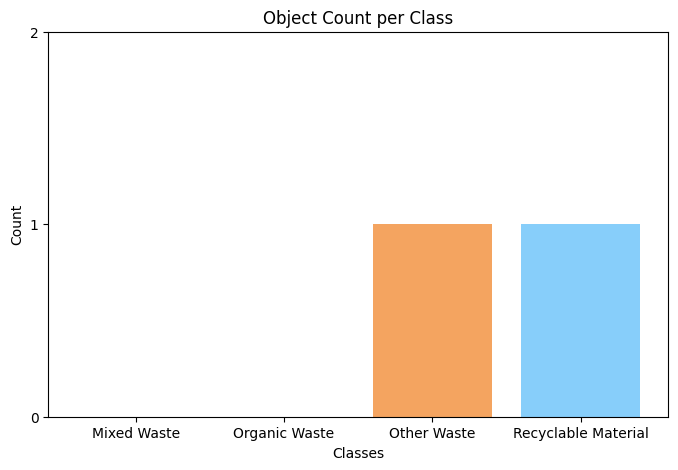

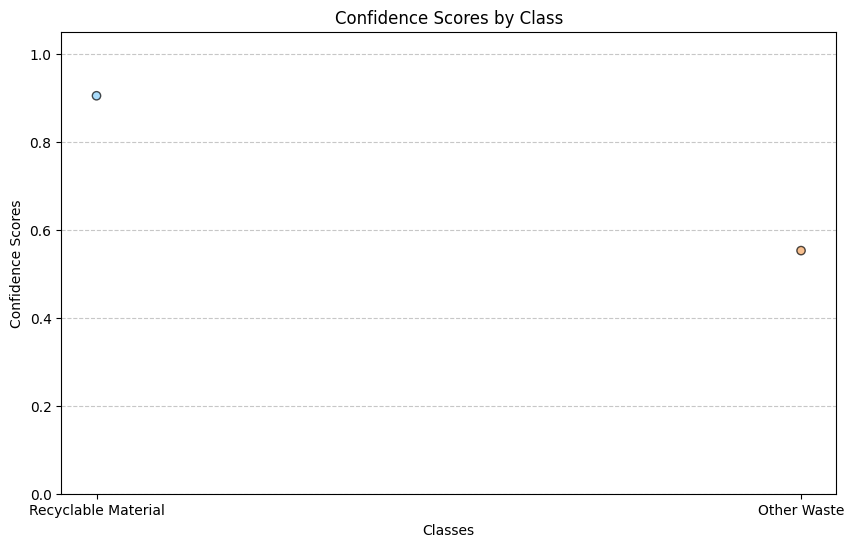

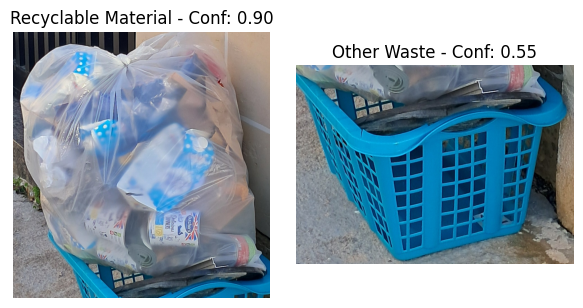

In [8]:
# Path to the selected version's folder
weights_path = os.path.join(os.getcwd(), "runs", "detect", selected_version, "weights", "best.pt")
test_folder_path = os.path.abspath(os.path.join(os.getcwd(), "..", "Test"))

print(f"Selected weights file: {weights_path}")

# Validate and process all images in the test folder
if not os.path.exists(test_folder_path):
    raise FileNotFoundError(f"Test folder not found at: {test_folder_path}")

test_images = [img for img in os.listdir(test_folder_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
if not test_images:
    raise ValueError(f"No valid image files found in the test folder: {test_folder_path}")

# Load the YOLO model
model = load_model(weights_path)

# Ensure plots are displayed inline
%matplotlib inline

# Loop through each test image
for test_image in test_images:
    test_image_path = os.path.join(test_folder_path, test_image)
    print(f"Processing test image: {test_image_path}")

    # Perform prediction on the current test image
    results = model.predict(source=test_image_path, device='cpu')

    # Load and process the images
    original_image = load_image(test_image_path)  # Ensure this loads the image in RGB

    # Filter out boxes with confidence less than 0.35
    filtered_boxes = results[0].boxes[results[0].boxes.conf > 0.35]

    # Create a copy of results and replace boxes with filtered ones
    results[0].boxes = filtered_boxes

    # Render the filtered results
    predicted_image = cv2.cvtColor(results[0].plot(), cv2.COLOR_BGR2RGB)  # Convert rendered image to RGB

    # Display the original and predicted images side by side
    display_images_side_by_side(original_image, predicted_image, results)

    # Analyze and display detection analytics
    analyze_detections(results, model)

    # Crop and display the detected bounding boxes in a grouped grid
    crop_and_display_boxes_grouped(original_image, results)